In [17]:
%load_ext autoreload
%autoreload

import pandas as pd
import numpy as np
import os
import sys
import re
import matplotlib.pyplot as plt
import datetime
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import SpectralClustering
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA

from sklearn.metrics import pairwise_distances_argmin_min
from sklearn import metrics

%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
plt.rcParams['figure.figsize'] = (16, 9)
plt.style.use('ggplot')


from itertools import cycle
import networkx as nx



from Bio import SeqIO
from Bio.SeqRecord import SeqRecord
from Bio.Seq import Seq
from Bio.Alphabet import IUPAC

from matplotlib_venn import venn2
from matplotlib_venn import venn3
from lineage import get_lineage_coll, get_lineage_snp
from resistance import get_resistance_snp
from coinfection_functions import import_VCF42_to_pandas, filter_repeats, add_snp_distance, \
                            scatter_vcf_pos, distplot_sns, add_window_distance

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [10]:
pd.set_option('display.max_columns', None)

In [19]:
sample_list = []
vcf_files = []
directory = "coinf_it"

for file in os.listdir(directory):
    if file.endswith(".vcf"):
        name = file.split(".")[0]
        sample_list.append(name)
        file_path = os.path.join(directory, file)
        vcf_files.append(file_path)
        
sample_list.sort()
vcf_files.sort()

print(sample_list)
print(vcf_files)

['1mixed', '2mixed', '3mixed', '4mixed', '5mixed', '6mixed']
['coinf_it/1mixed.snp.hf.pass.vcf', 'coinf_it/2mixed.snp.hf.pass.vcf', 'coinf_it/3mixed.snp.hf.pass.vcf', 'coinf_it/4mixed.snp.hf.pass.vcf', 'coinf_it/5mixed.snp.hf.pass.vcf', 'coinf_it/6mixed.snp.hf.pass.vcf']


# Import vcf as dataframe

In [20]:
x = datetime.datetime.now()
print(x)
dict_vcf = {}
for vcf, df_name in zip(vcf_files, sample_list):
    dict_vcf[df_name] = import_VCF42_to_pandas(vcf)
y = datetime.datetime.now()
print(y)
print("Done with import in: %s" % (y - x))

2019-05-31 14:15:59.924469
2019-05-31 14:17:15.697363
Done with import in: 0:01:15.772894


In [21]:
dict_vcf[sample_list[2]].head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF
0,MTB_anc,237,.,G,A,2955.79,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-4.350e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:22,111:133:99:2966,0,405",1.0,0.5,2.0,-4.350,133.0,3.0103,4.440,60.0,0.0,22.22,0.264,0.533,0/1,"22,111",99.0,"2966,0,405",NaN,NaN,NaN,2,22.0,111.0,0,1,133.0,0.165414,0.834586
1,MTB_anc,4191,.,A,G,2466.79,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=2.15;DP=106;Ex...,GT:AD:DP:GQ:PL,"0/1:21,85:106:99:2477,0,294",1.0,0.5,2.0,2.150,106.0,3.0103,3.280,60.0,0.0,23.27,-0.389,0.615,0/1,"21,85",99.0,"2477,0,294",NaN,NaN,NaN,2,21.0,85.0,0,1,106.0,0.198113,0.801887
2,MTB_anc,5075,.,C,T,3452.79,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.797e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:32,128:160:99:3463,0,649",1.0,0.5,2.0,-3.797,160.0,3.0103,0.000,60.0,0.0,21.58,-1.129,0.724,0/1,"32,128",99.0,"3463,0,649",NaN,NaN,NaN,2,32.0,128.0,0,1,160.0,0.200000,0.800000
3,MTB_anc,6112,.,G,C,2710.79,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.172e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:13,103:116:65:2721,0,65",1.0,0.5,2.0,-1.172,116.0,3.0103,1.140,60.0,0.0,23.37,1.910,0.458,0/1,"13,103",65.0,"2721,0,65",NaN,NaN,NaN,2,13.0,103.0,0,1,116.0,0.112069,0.887931
4,MTB_anc,8452,.,C,T,2916.79,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.101e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:32,114:146:99:2927,0,678",1.0,0.5,2.0,-3.101,146.0,3.0103,0.745,60.0,0.0,19.98,-1.051,0.582,0/1,"32,114",99.0,"2927,0,678",NaN,NaN,NaN,2,32.0,114.0,0,1,146.0,0.219178,0.780822


In [22]:
dict_vcf[sample_list[2]].columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR', 'GT', 'AD', 'GQ',
       'PL', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD', 'ALT_AD', 'gt0', 'gt1',
       'dp', 'aF', 'AF'],
      dtype='object')

# Add repeat and snp distance info

In [23]:
#dict_vcf = {}

for name, vcf_df in dict_vcf.items():
    #Add repeat info (Phage, Transposon or PE/PPE regions)
    vcf_df['Is_repeat'] = vcf_df.apply(filter_repeats, axis=1)

    #Add info of nearby positions
    add_snp_distance(vcf_df)
    
    #Add info of clustered positions in sliding window
    add_window_distance(vcf_df, window_size=10)

In [16]:
dict_vcf[sample_list[2]].columns

Index(['#CHROM', 'POS', 'ID', 'REF', 'ALT', 'QUAL', 'FILTER', 'INFO', 'FORMAT',
       'sample', 'AC', 'af', 'AN', 'BaseQRankSum', 'DP', 'ExcessHet', 'FS',
       'MLEAC', 'MLEAF', 'MQ', 'MQRankSum', 'QD', 'ReadPosRankSum', 'SOR',
       'GT', 'AD', 'GQ', 'PL', 'PGT', 'PID', 'PS', 'len_AD', 'REF_AD',
       'ALT_AD', 'gt0', 'gt1', 'dp', 'aF', 'AF', 'Is_repeat',
       'snp_left_distance', 'snp_right_distance', 'Window_10'],
      dtype='object')

# Create a set of filtered df in different dictionary

In [33]:
dict_dff = {}
distance = 15
QD = 0
for name, df_vcf in dict_vcf.items():
    list_positions_to_filter = df_vcf['POS'][(
                                (df_vcf.snp_left_distance <= distance)|
                                (df_vcf.snp_right_distance <= distance)|
                                (df_vcf.Window_10 >= 3)|
                                (df_vcf.Is_repeat == True) |
                                (df_vcf.AF <= 0.0) |
                                (df_vcf.len_AD > 2) |
                                (df_vcf.QD <= QD))].tolist()
    dict_dff[name] = df_vcf[~df_vcf.POS.isin(list_positions_to_filter)]

In [26]:
dict_vcf[sample_list[2]][dict_vcf[sample_list[2]].AF < 0.5].QD.describe()

count    1374.000000
mean        4.383319
std         3.117604
min         0.290000
25%         2.320000
50%         3.660000
75%         5.240000
max        19.930000
Name: QD, dtype: float64

In [7]:
dict_vcf[sample_list[2]][dict_vcf[sample_list[2]].snp_left_distance <= 30].head()

NameError: name 'dict_vcf' is not defined

In [2]:
dict_vcf[sample_list[2]][[(dict_vcf[sample_list[2]].AC != 2) & (dict_vcf[sample_list[2]].gt0 != 1)]]

NameError: name 'dict_vcf' is not defined

In [79]:
for name_dsf, df in dict_vcf.items():
    scatter_vcf_pos(df,name_dsf)

IndexError: too many indices for array

In [60]:
for name_dsf, df in dict_dff.items():
    scatter_vcf_pos(df,name_dsf)

IndexError: too many indices for array

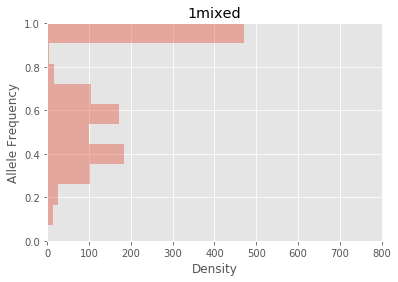

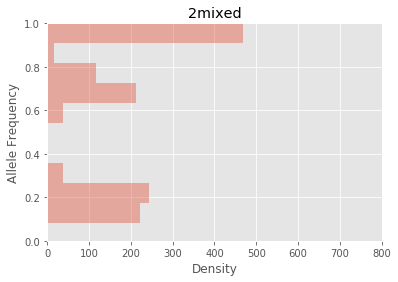

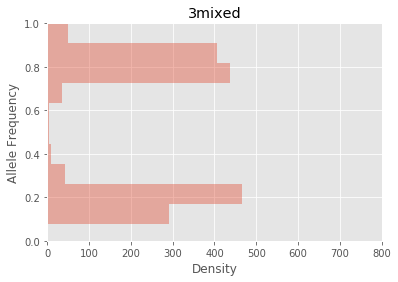

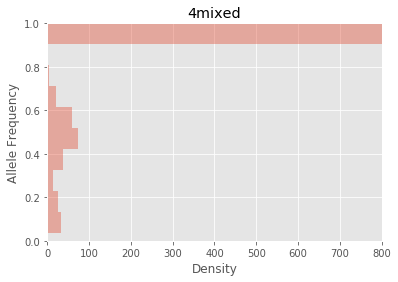

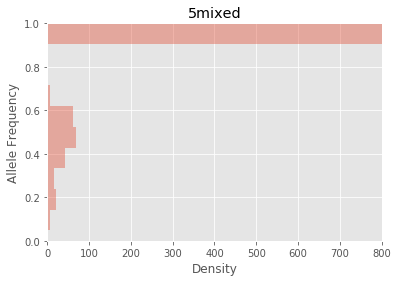

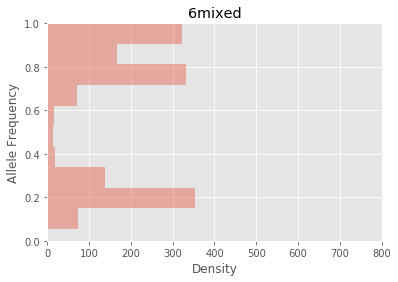

In [35]:
for name_dsf, df in dict_dff.items():
    distplot_sns(df,name_dsf)

In [36]:
def split_df_mean(vcf_df, homoz=0.95):
    filter_homoz_top = homoz
    filter_homoz_bottom = (1 - filter_homoz_top)
    
    #mean = vcf_df['AF'][(vcf_df['AF'] <= filter_homoz_top) & (vcf_df['AF'] >= filter_homoz_bottom)].mean(axis = 0)
    mean = vcf_df['AF'][(vcf_df.AC != 2) & (vcf_df.gt0 != 1)].mean(axis = 0)    


    top_positions = vcf_df['POS'][(vcf_df['AF'] >= mean) & (vcf_df.AC != 2) & (vcf_df.gt0 != 1)].tolist()
    bottom_positions = vcf_df['POS'][(vcf_df['AF'] < mean)].tolist()
    
    return top_positions, bottom_positions

In [39]:
dict_t_b = {}
for name_dff, df_dff in dict_dff.items():
    name_top = name_dff + "_t"
    name_btm = name_dff + "_b"
    name_top , name_btm = split_df_mean(df_dff)
    dict_t_b[name_dff] = name_top , name_btm

In [40]:
for k,v in dict_t_b.items():
    print(k,len(v[0]), len(v[1]))

1mixed 349 372
2mixed 388 507
3mixed 894 811
4mixed 166 109
5mixed 133 100
6mixed 590 593


# Create sets for comparing

In [294]:
B = set(dict_dff['BURGOS89109'].POS.values)
P = set(dict_dff['56850173'].POS.values)
A75 = set(dict_dff['AL-75607'].POS.values)
A14 = set(dict_dff['AL14621'].POS.values)
F = set(dict_dff['16250874FFD'].POS.values)
S = set(dict_dff['SOMOZACOL2'].POS.values)

In [43]:
B_exclusive = set(dict_t_b['3mixed'][1]) - set(dict_t_b['3mixed'][0])
P_exclusive = set(dict_t_b['3mixed'][0]) - set(dict_t_b['3mixed'][1])
#Shared_B_P = P & B
total_difference_B_P = (len(B_exclusive) + len(P_exclusive))
print("B has %s unique positions\n\
P has %s unique positions\n\
Total difference: %s" % (len(B_exclusive) , len(P_exclusive),total_difference_B_P ))

B has 811 unique positions
P has 894 unique positions
Total difference: 1705


In [296]:
A75_exclusive = A75 - A14
A14_exclusive = A14 - A75
Shared_A75_A14 = A14 & A75

print("A75 has %s unique positions\n\
A14 has %s unique positions\n\
Both share %s positions" % (len(A75_exclusive) , len(A14_exclusive), len(Shared_A75_A14)))

A75 has 16 unique positions
A14 has 10 unique positions
Both share 889 positions


In [297]:
F_exclusive = F - S
S_exclusive = S - F
Shared_F_S = S & F

print("F has %s unique Positions\n\
S has %s unique Sositions\n\
Both share %s Positions" % (len(F_exclusive) , len(S_exclusive), len(Shared_F_S)))

F has 2 unique Positions
S has 4 unique Sositions
Both share 870 Positions


# Use venn diagram to check disgregation

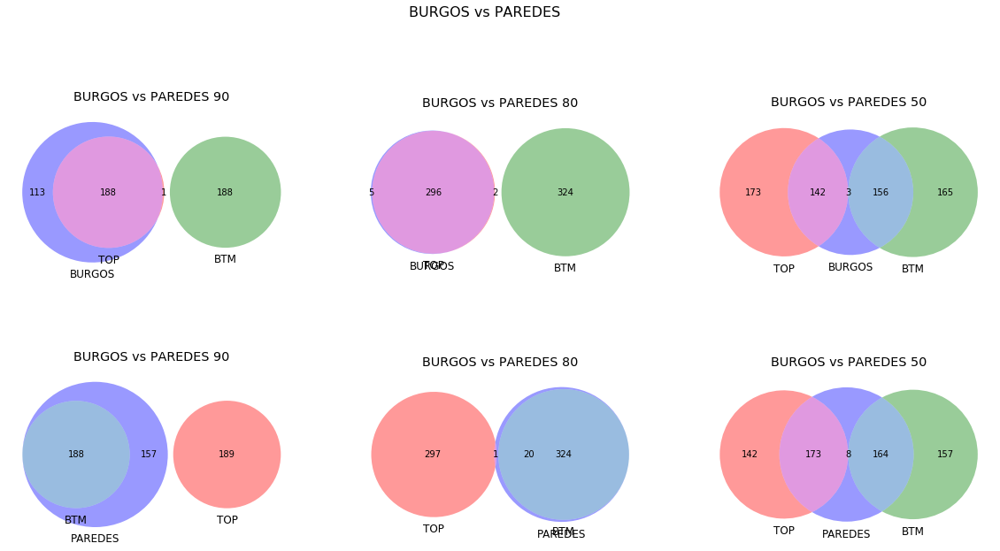

In [499]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("BURGOS vs PAREDES 90")
v3 = venn3([set(dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), B_exclusive], 
            set_labels = ('TOP', 'BTM', 'BURGOS'))

plt.subplot(2, 3, 2)
plt.title("BURGOS vs PAREDES 80")
v3 = venn3([set(dict_t_b['P1_80'][0]), set(dict_t_b['P1_80'][1]), B_exclusive], 
            set_labels = ('TOP', 'BTM', 'BURGOS'))

plt.subplot(2, 3, 3)
plt.title("BURGOS vs PAREDES 50")
v3 = venn3([set(dict_t_b['P1_50'][0]), set(dict_t_b['P1_50'][1]), B_exclusive], 
            set_labels = ('TOP', 'BTM', 'BURGOS'))

plt.suptitle('BURGOS vs PAREDES', fontsize=16, verticalalignment='bottom')


plt.subplot(2, 3, 4)
plt.title("BURGOS vs PAREDES 90")
v3 = venn3([set(dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), P_exclusive], 
            set_labels = ('TOP', 'BTM', 'PAREDES'))

plt.subplot(2, 3, 5)
plt.title("BURGOS vs PAREDES 80")
v3 = venn3([set(dict_t_b['P1_80'][0]), set(dict_t_b['P1_80'][1]), P_exclusive], 
            set_labels = ('TOP', 'BTM', 'PAREDES'))

plt.subplot(2, 3, 6)
plt.title("BURGOS vs PAREDES 50")
v3 = venn3([set(dict_t_b['P1_50'][0]), set(dict_t_b['P1_50'][1]), P_exclusive], 
            set_labels = ('TOP', 'BTM', 'PAREDES'))

#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

In [495]:
#dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), P_exclusive]
P_not_in_Bttm = P_exclusive - set(dict_t_b['P1_80'][1])
dict_dff['P1_80'][dict_dff['P1_80'].POS.isin(P_not_in_Bttm)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
256,MTB_anc,584438,.,G,A,2602.88,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.00;DP=6;Exce...,GT:AD:DP:GQ:PL,"0/1:2,4:6:51:108,0,51",1.0,0.5,2.0,0.0,6.0,0.0182,15.721,0.5842,60.0,0.0,27.99,1.11,0.153,0/1,"2,4",51.0,"108,0,51",NaN,NaN,NaN,2,2.0,4.0,0,1,6.0,0.333333,0.666667,False,267.0,73.0,1,2


In [496]:
#dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), P_exclusive]
Bttm_not_in_P = set(dict_t_b['P1_80'][1]) - P_exclusive
dict_dff['P1_80'][dict_dff['P1_80'].POS.isin(Bttm_not_in_P)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category


In [497]:
#dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), P_exclusive]
Top_not_in_B = set(dict_t_b['P1_80'][0]) - B_exclusive
dict_dff['P1_80'][dict_dff['P1_80'].POS.isin(Top_not_in_B)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
256,MTB_anc,584438,.,G,A,2602.88,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.00;DP=6;Exce...,GT:AD:DP:GQ:PL,"0/1:2,4:6:51:108,0,51",1.0,0.5,2.0,0.000,6.0,0.0182,15.721,0.5842,60.00,0.000,27.99,1.11,0.153,0/1,"2,4",51.0,"108,0,51",NaN,NaN,NaN,2,2.0,4.0,0,1,6.0,0.333333,0.666667,False,267.0,73.0,1,2
1099,MTB_anc,3122096,.,C,T,3145.82,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.082e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:10,13:23:99:496,0,341",1.0,0.5,2.0,-2.082,23.0,0.1954,14.793,0.4680,56.92,0.228,34.57,1.61,2.259,0/1,"10,13",99.0,"496,0,341",NaN,NaN,NaN,2,10.0,13.0,0,1,23.0,0.434783,0.565217,False,31.0,847.0,1,3


In [498]:
#dict_t_b['P1_90'][0]), set(dict_t_b['P1_90'][1]), P_exclusive]
B_not_in_Top = B_exclusive - set(dict_t_b['P1_80'][0])
dict_dff['P1_80'][dict_dff['P1_80'].POS.isin(B_not_in_Top)]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
441,MTB_anc,1180072,.,G,A,11720.76,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=-1.745e+00;DP=7...,GT:AD:DP:GQ:PL,"1/1:2,72:74:99:2105,134,0",2.0,1.0,2.0,-1.745,74.0,0.002,7.521,0.8519,60.0,0.0,28.04,0.184,0.133,1/1,"2,72",99.0,"2105,134,0",NaN,NaN,NaN,2,2.0,72.0,1,1,74.0,0.027027,0.972973,False,1956.0,3762.0,1,1
1248,MTB_anc,3599912,.,T,C,11693.76,PASS,AC=2;AF=1.00;AN=2;BaseQRankSum=2.09;DP=61;Exce...,GT:AD:DP:GQ:PL,"1/1:5,56:61:37:1935,37,0",2.0,1.0,2.0,2.090,61.0,0.002,3.263,0.8518,60.0,0.0,32.66,0.645,0.469,1/1,"5,56",37.0,"1935,37,0",NaN,NaN,NaN,2,5.0,56.0,1,1,61.0,0.081967,0.918033,False,5788.0,10216.0,1,1


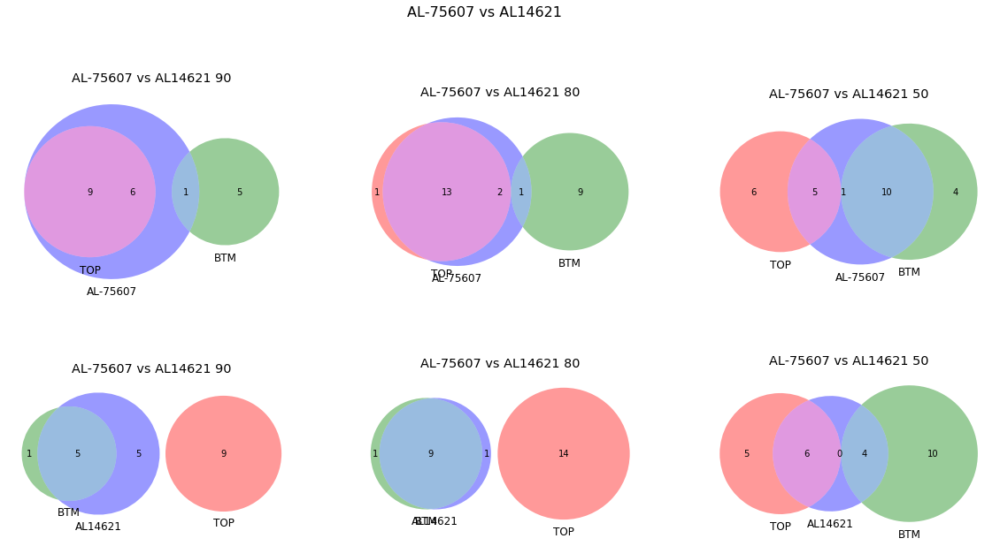

In [485]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("AL-75607 vs AL14621 90")
v3 = venn3([set(dict_t_b['P2_90'][0]), set(dict_t_b['P2_90'][1]), A75_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL-75607'))

plt.subplot(2, 3, 2)
plt.title("AL-75607 vs AL14621 80")
v3 = venn3([set(dict_t_b['P2_80'][0]), set(dict_t_b['P2_80'][1]), A75_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL-75607'))

plt.subplot(2, 3, 3)
plt.title("AL-75607 vs AL14621 50")
v3 = venn3([set(dict_t_b['P2_50'][0]), set(dict_t_b['P2_50'][1]), A75_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL-75607'))

plt.suptitle('AL-75607 vs AL14621', fontsize=16, verticalalignment='bottom')


plt.subplot(2, 3, 4)
plt.title("AL-75607 vs AL14621 90")
v3 = venn3([set(dict_t_b['P2_90'][0]), set(dict_t_b['P2_90'][1]), A14_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL14621'))

plt.subplot(2, 3, 5)
plt.title("AL-75607 vs AL14621 80")
v3 = venn3([set(dict_t_b['P2_80'][0]), set(dict_t_b['P2_80'][1]), A14_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL14621'))

plt.subplot(2, 3, 6)
plt.title("AL-75607 vs AL14621 50")
v3 = venn3([set(dict_t_b['P2_50'][0]), set(dict_t_b['P2_50'][1]), A14_exclusive], 
            set_labels = ('TOP', 'BTM', 'AL14621'))

#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

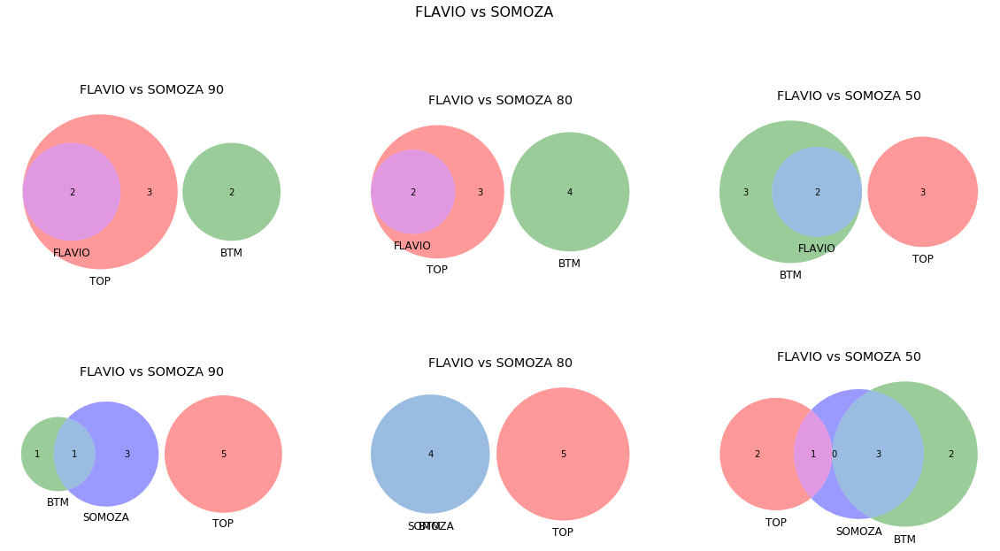

In [487]:
plt.figure(figsize=(20,10))

plt.subplot(2, 3, 1)
plt.title("FLAVIO vs SOMOZA 90")
v3 = venn3([set(dict_t_b['P3_90'][0]), set(dict_t_b['P3_90'][1]), F_exclusive], 
            set_labels = ('TOP', 'BTM', 'FLAVIO'))

plt.subplot(2, 3, 2)
plt.title("FLAVIO vs SOMOZA 80")
v3 = venn3([set(dict_t_b['P3_80'][0]), set(dict_t_b['P3_80'][1]), F_exclusive], 
            set_labels = ('TOP', 'BTM', 'FLAVIO'))

plt.subplot(2, 3, 3)
plt.title("FLAVIO vs SOMOZA 50")
v3 = venn3([set(dict_t_b['P3_50'][0]), set(dict_t_b['P3_50'][1]), F_exclusive], 
            set_labels = ('TOP', 'BTM', 'FLAVIO'))

plt.suptitle('FLAVIO vs SOMOZA', fontsize=16, verticalalignment='bottom')


plt.subplot(2, 3, 4)
plt.title("FLAVIO vs SOMOZA 90")
v3 = venn3([set(dict_t_b['P3_90'][0]), set(dict_t_b['P3_90'][1]), S_exclusive], 
            set_labels = ('TOP', 'BTM', 'SOMOZA'))

plt.subplot(2, 3, 5)
plt.title("FLAVIO vs SOMOZA 80")
v3 = venn3([set(dict_t_b['P3_80'][0]), set(dict_t_b['P3_80'][1]), S_exclusive], 
            set_labels = ('TOP', 'BTM', 'SOMOZA'))

plt.subplot(2, 3, 6)
plt.title("FLAVIO vs SOMOZA 50")
v3 = venn3([set(dict_t_b['P3_50'][0]), set(dict_t_b['P3_50'][1]), S_exclusive], 
            set_labels = ('TOP', 'BTM', 'SOMOZA'))

#plt.savefig(os.path.join('img', 'SOMOZA_ALL.svg'), format="svg")

plt.show()

# Start K-means clustering

### Thanks to: http://www.aprendemachinelearning.com/k-means-en-python-paso-a-paso/

In [301]:
dict_dff['P1_50'].describe()

,POS,QUAL,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GQ,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,snp_left_distance,snp_right_distance,Window_10
count,1.179000e+03,1179.000000,1179.000000,1179.000000,1179.0,785.000000,1179.000000,1179.000000,1179.000000,1179.000000,785.000000,1179.000000,784.000000,1179.000000,1179.000000,1179.0,1179.000000,1179.000000,1179.000000,1179.0,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000,1179.000000
mean,2.173089e+06,30353.597405,1.451230,0.725615,2.0,0.190948,63.531807,1.417363,1.998997,59.839152,-0.007205,29.936667,0.191953,0.751634,98.504665,2.0,17.391009,46.135708,0.451230,1.0,63.526718,0.273767,0.726233,3359.735369,3314.277354,1.033079
std,1.325588e+06,16140.032802,0.497827,0.248913,0.0,1.855847,17.432274,1.495430,4.060021,1.255724,0.695876,3.307449,1.005886,0.346808,4.432930,0.0,17.548592,21.152857,0.497827,0.0,17.433256,0.258014,0.258014,3578.395386,3432.923815,0.178918
min,1.977000e+03,2602.880000,1.000000,0.500000,2.0,-4.556000,6.000000,0.000300,0.000000,43.050000,-7.441000,16.820000,-2.697000,0.013000,18.000000,2.0,0.000000,3.000000,0.000000,1.0,6.000000,0.000000,0.187500,1.000000,1.000000,1.000000
25%,1.051145e+06,17968.610000,1.000000,0.500000,2.0,-1.340000,52.000000,0.011100,0.000000,60.000000,0.000000,27.575000,-0.555000,0.536000,99.000000,2.0,0.000000,29.000000,0.000000,1.0,52.000000,0.000000,0.490381,868.500000,868.500000,1.000000
50%,2.140753e+06,26523.510000,1.000000,0.500000,2.0,0.287000,62.000000,0.195400,0.000000,60.000000,0.000000,30.260000,0.141500,0.740000,99.000000,2.0,18.000000,42.000000,0.000000,1.0,62.000000,0.375000,0.625000,2140.000000,2163.000000,1.000000
75%,3.295218e+06,43515.270000,2.000000,1.000000,2.0,1.710000,76.000000,3.010300,2.274000,60.000000,0.000000,32.760000,0.933000,0.921000,99.000000,2.0,32.000000,61.000000,1.000000,1.0,76.000000,0.509619,1.000000,4694.000000,4694.000000,1.000000
max,4.408923e+06,87850.270000,2.000000,1.000000,2.0,6.150000,130.000000,10.548300,33.993000,60.000000,7.750000,37.710000,2.660000,2.833000,99.000000,2.0,66.000000,130.000000,1.000000,1.0,130.000000,0.812500,1.000000,31347.000000,21698.000000,2.000000


/home/laura/env36/lib/python3.6/site-packages/numpy/lib/histograms.py:778: RuntimeWarning: Converting input from bool to <class 'numpy.uint8'> for compatibility.
  a, weights = _ravel_and_check_weights(a, weights)


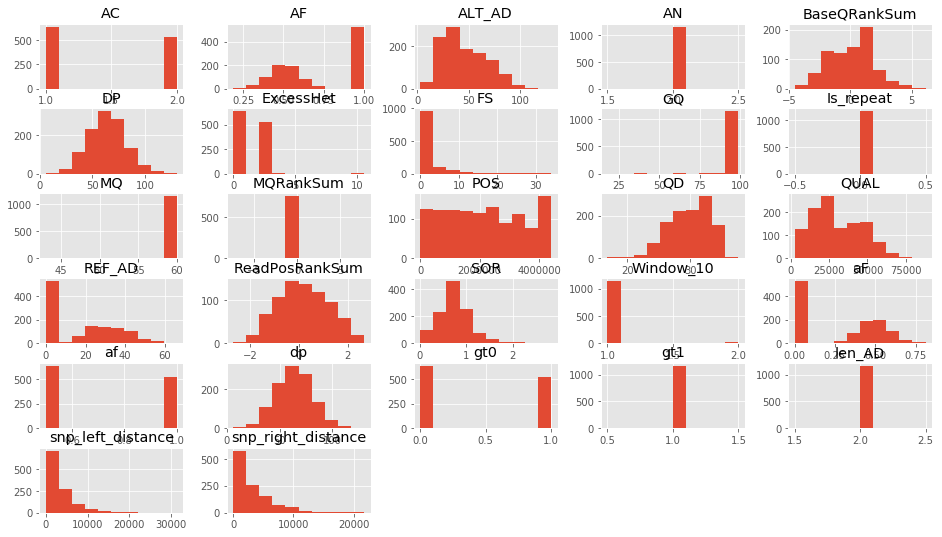

In [500]:
dict_dff['P1_50'].hist()
plt.show()

In [44]:
def assign_group_P1(row):
    if row.POS in B_exclusive:
        return 1
    elif row.POS in P_exclusive:
        return 2
    else:
        return 3


In [733]:
def assign_group_P2(row):
    if row.POS in A75_exclusive:
        return 1
    elif row.POS in A14_exclusive:
        return 2
    else:
        return 3


In [46]:
Ktest5 = dict_dff['3mixed'][(dict_dff['3mixed'].AC != 2) & (dict_dff['3mixed'].gt0 != 1)]


In [47]:
Ktest5.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,MLEAC,MLEAF,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10
0,MTB_anc,237,.,G,A,3228.6,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-9.720e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:22,111:133:99:3236,0,383",1.0,0.5,2.0,-0.972,133.0,3.0103,4.440,1.0,0.5,60.0,0.0,24.28,0.264,0.533,0/1,"22,111",99.0,"3236,0,383",NaN,NaN,NaN,2,22.0,111.0,0,1,133.0,0.165414,0.834586,False,237.0,3954.0,1
1,MTB_anc,4191,.,A,G,2379.6,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.114;DP=105;E...,GT:AD:DP:GQ:PL,"0/1:21,84:105:99:2387,0,349",1.0,0.5,2.0,0.114,105.0,3.0103,3.310,1.0,0.5,60.0,0.0,22.66,-0.381,0.649,0/1,"21,84",99.0,"2387,0,349",NaN,NaN,NaN,2,21.0,84.0,0,1,105.0,0.200000,0.800000,False,3954.0,884.0,1
2,MTB_anc,5075,.,C,T,3620.6,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.065e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:32,126:158:99:3628,0,615",1.0,0.5,2.0,-1.065,158.0,3.0103,0.000,1.0,0.5,60.0,0.0,22.92,-1.095,0.693,0/1,"32,126",99.0,"3628,0,615",NaN,NaN,NaN,2,32.0,126.0,0,1,158.0,0.202532,0.797468,False,884.0,1037.0,1
3,MTB_anc,6112,.,G,C,2643.6,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-5.340e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:13,102:115:56:2651,0,56",1.0,0.5,2.0,-0.534,115.0,3.0103,1.138,1.0,0.5,60.0,0.0,22.99,1.870,0.473,0/1,"13,102",56.0,"2651,0,56",NaN,NaN,NaN,2,13.0,102.0,0,1,115.0,0.113043,0.886957,False,1037.0,2340.0,1
4,MTB_anc,8452,.,C,T,3262.6,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-4.150e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:32,114:146:99:3270,0,630",1.0,0.5,2.0,-0.415,146.0,3.0103,0.745,1.0,0.5,60.0,0.0,22.35,-1.051,0.582,0/1,"32,114",99.0,"3270,0,630",NaN,NaN,NaN,2,32.0,114.0,0,1,146.0,0.219178,0.780822,False,2340.0,691.0,1


In [48]:
Ktest5['category'] = Ktest5.apply(assign_group_P1, axis=1)


/home/laura/env36/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [49]:
Ktest5[Ktest5.category == 3]

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,MLEAC,MLEAF,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category


In [50]:

Ktest5 = Ktest5[Ktest5.category != 3]



In [507]:
Ktest8.gt0[Ktest8.category == 1].value_counts()

0    296
Name: gt0, dtype: int64

In [739]:
Atest8.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
43,MTB_anc,127870,.,A,G,2906.38,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=2.30;DP=45;Exc...,GT:AD:DP:GQ:PL,"0/1:33,12:45:99:288,0,963",1.0,0.5,2.0,2.300,45.0,0.6695,8.532,0.3014,60.0,0.0,15.54,-1.432,1.223,0/1,"33,12",99.0,"288,0,963",NaN,NaN,NaN,2,33.0,12.0,0,1,45.0,0.733333,0.266667,False,1067.0,9813.0,1,2
56,MTB_anc,203868,.,C,A,2323.62,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.323e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:6,13:19:99:331,0,200",1.0,0.5,2.0,-3.323,19.0,1.0462,14.765,0.2000,60.0,0.0,21.12,-1.105,0.339,0/1,"6,13",99.0,"331,0,200",NaN,NaN,NaN,2,6.0,13.0,0,1,19.0,0.315789,0.684211,False,1972.0,2613.0,1,1
183,MTB_anc,458923,.,C,T,3294.75,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-9.210e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:60,12:72:99:197,0,1847",1.0,0.5,2.0,-0.921,72.0,0.6305,7.753,0.3651,60.0,0.0,15.25,-0.224,0.369,0/1,"60,12",99.0,"197,0,1847",NaN,NaN,NaN,2,60.0,12.0,0,1,72.0,0.833333,0.166667,False,1471.0,8581.0,1,2
208,MTB_anc,549592,.,C,T,3173.18,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.504e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:64,14:80:99:225,0,1958",1.0,0.5,2.0,-1.504,80.0,0.3892,1.090,0.4375,60.0,0.0,15.26,1.430,0.809,0/1,"64,14",99.0,"225,0,1958",NaN,NaN,NaN,2,64.0,14.0,0,1,78.0,0.820513,0.179487,False,3235.0,1933.0,1,2
243,MTB_anc,690276,.,T,C,8034.89,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.816;DP=57;Ex...,GT:AD:DP:GQ:PL,"0/1:12,45:57:99:1354,0,263",1.0,0.5,2.0,0.816,57.0,0.0251,2.701,0.6786,60.0,0.0,26.34,0.894,0.518,0/1,"12,45",99.0,"1354,0,263",NaN,NaN,NaN,2,12.0,45.0,0,1,57.0,0.210526,0.789474,False,28.0,174.0,1,1


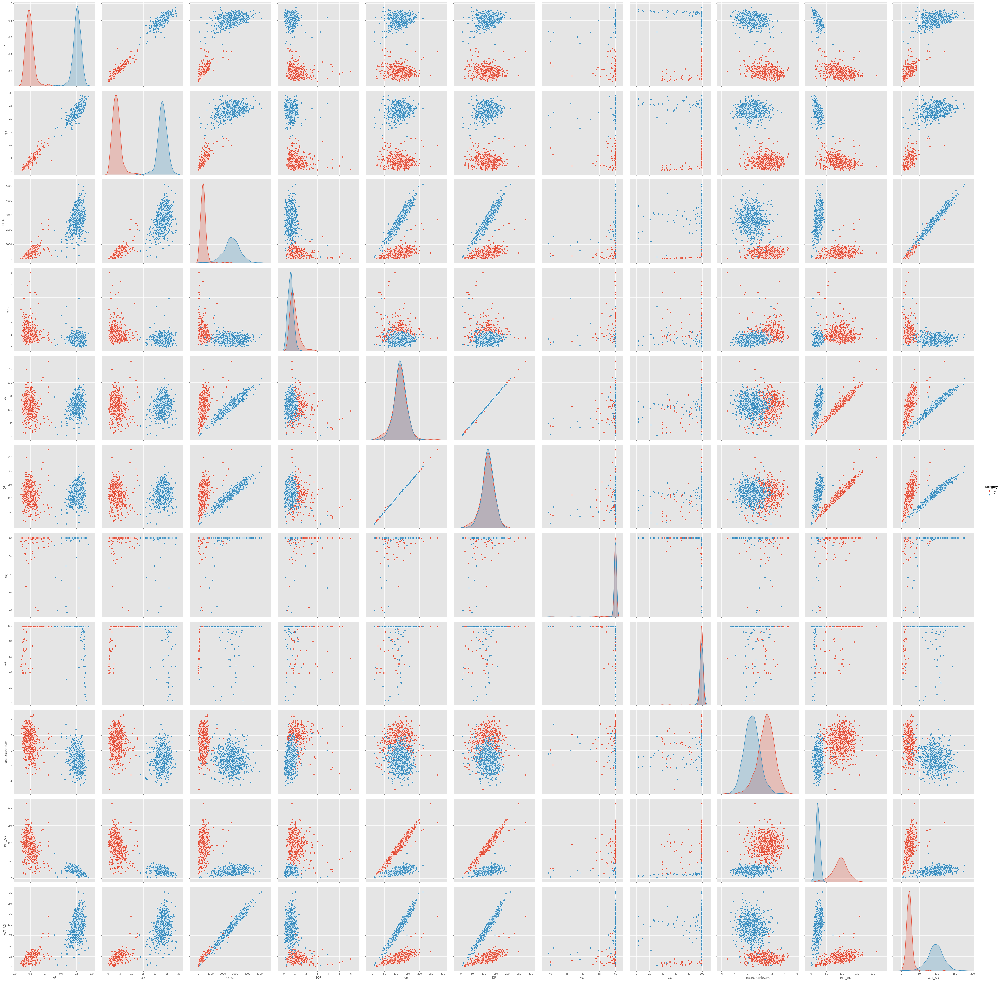

In [52]:
sns.pairplot(Ktest5, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","GQ","BaseQRankSum","REF_AD", "ALT_AD"],kind='scatter')

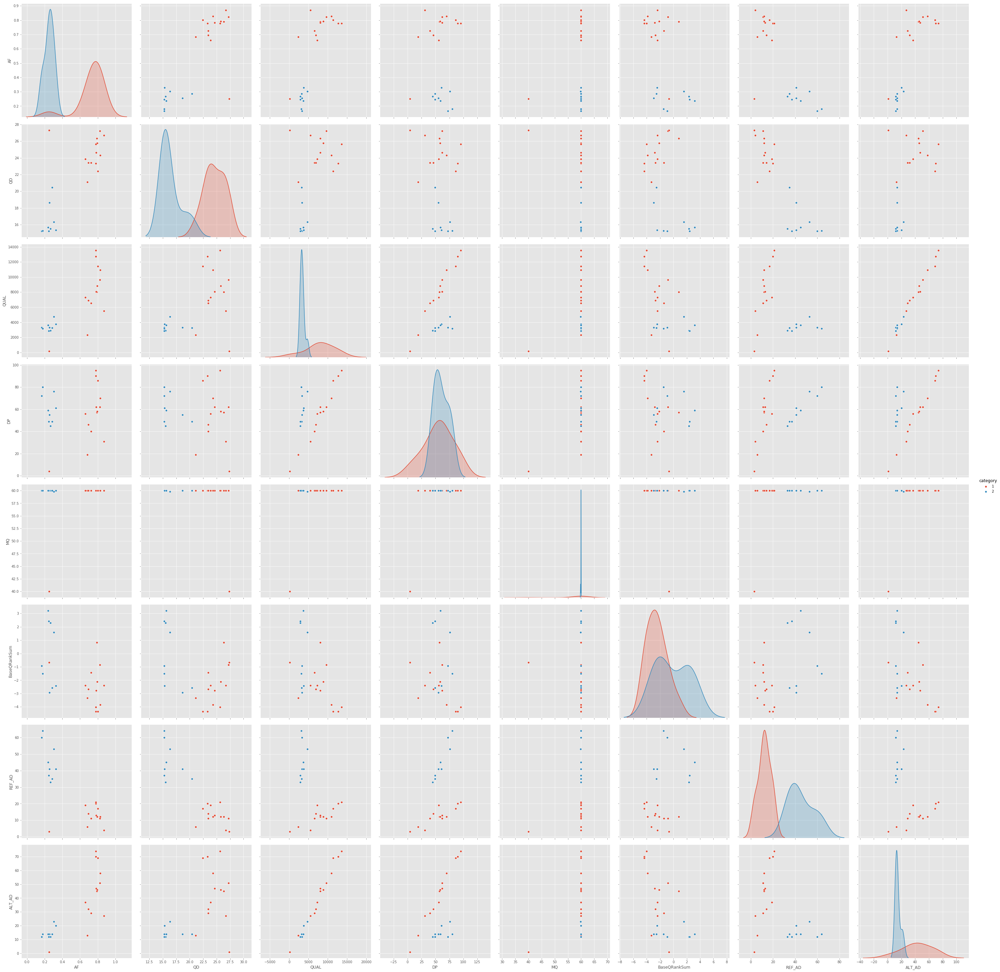

In [777]:
sns.pairplot(Atest8, hue='category',size=5,vars=["AF","QD", "QUAL","DP", "MQ", "BaseQRankSum","REF_AD", "ALT_AD"],kind='scatter')

/home/laura/env36/lib/python3.6/site-packages/seaborn/axisgrid.py:2065: UserWarning: The `size` parameter has been renamed to `height`; pleaes update your code.
  warnings.warn(msg, UserWarning)


ValueError: array must not contain infs or NaNs

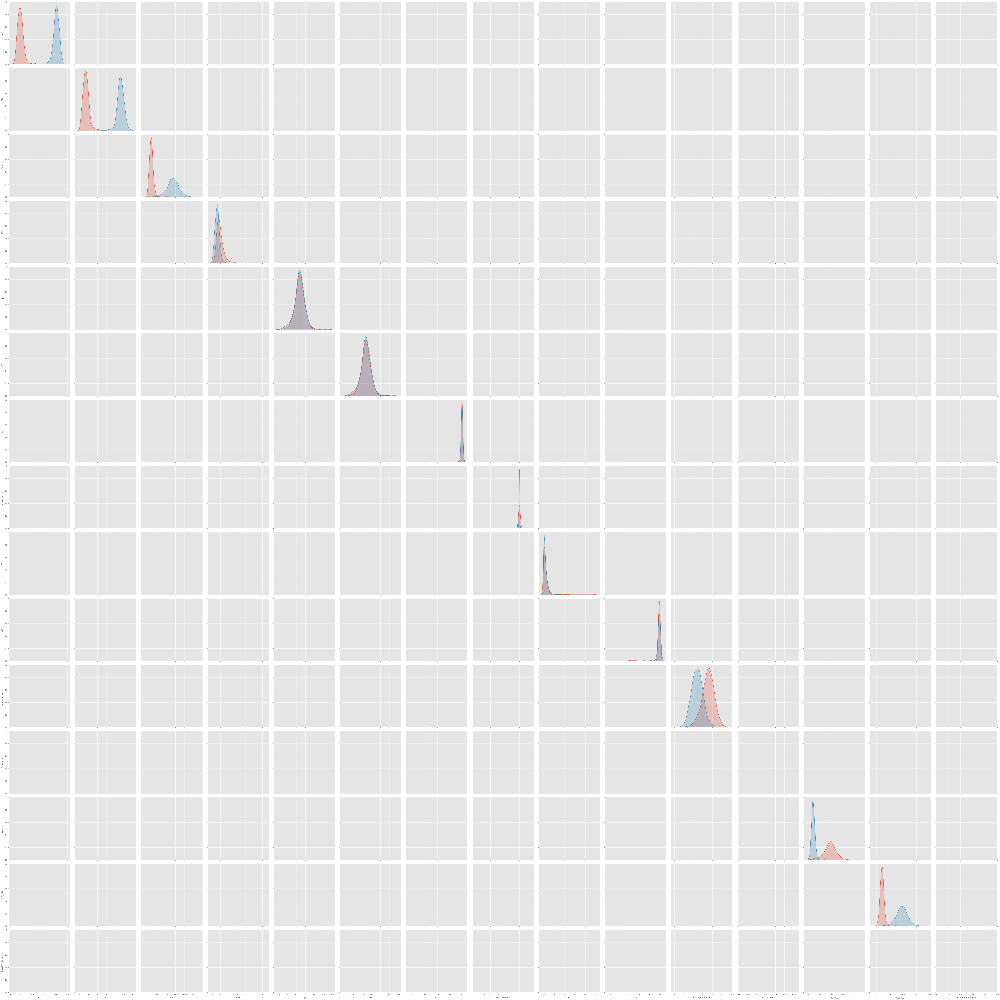

In [51]:
sns.pairplot(Ktest5, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"],kind='scatter')

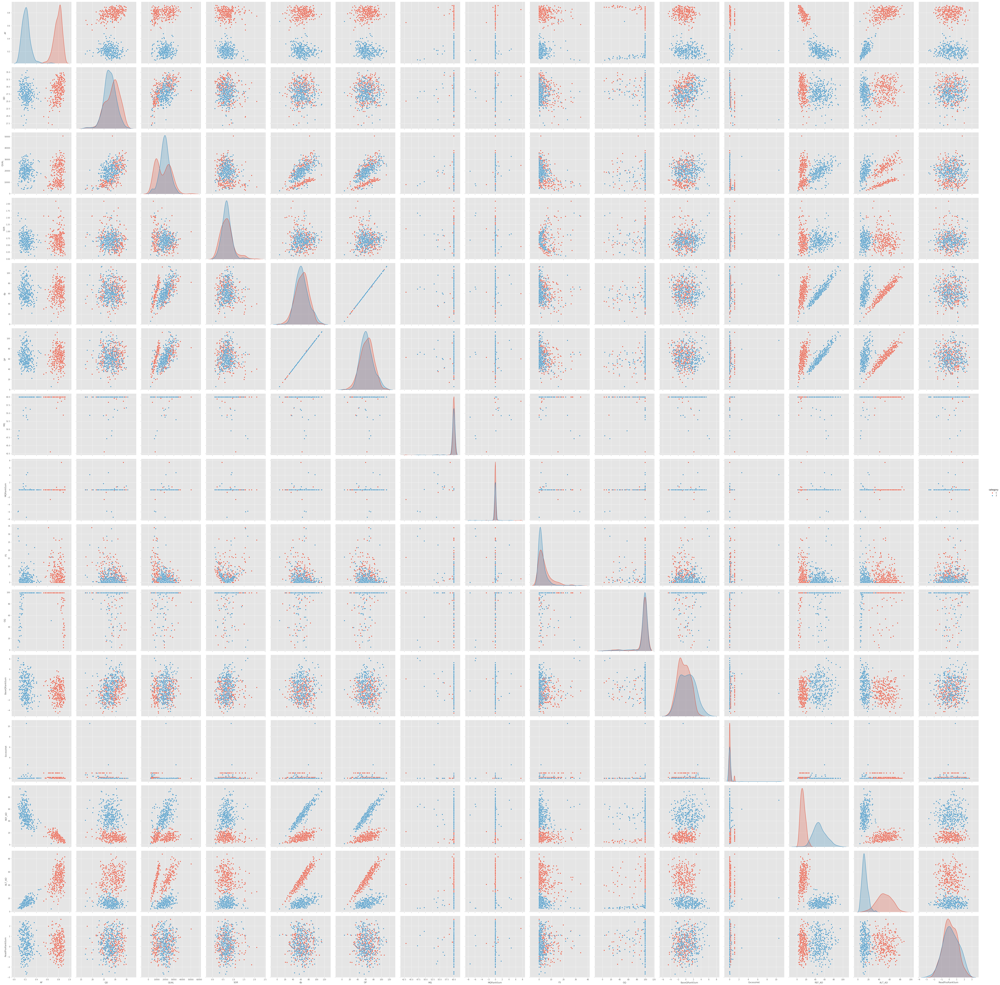

In [520]:
sns.pairplot(Ktest8, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"],kind='scatter')

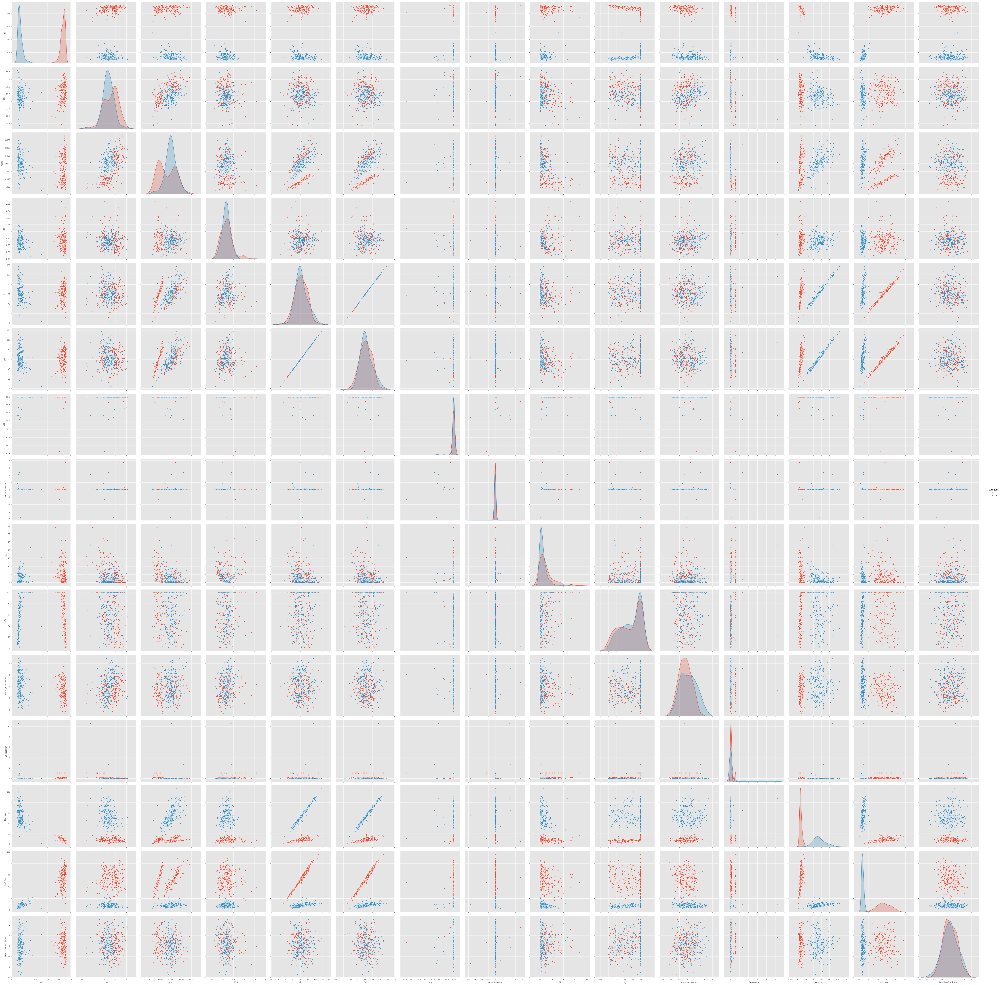

In [521]:
sns.pairplot(Ktest9, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"],kind='scatter')

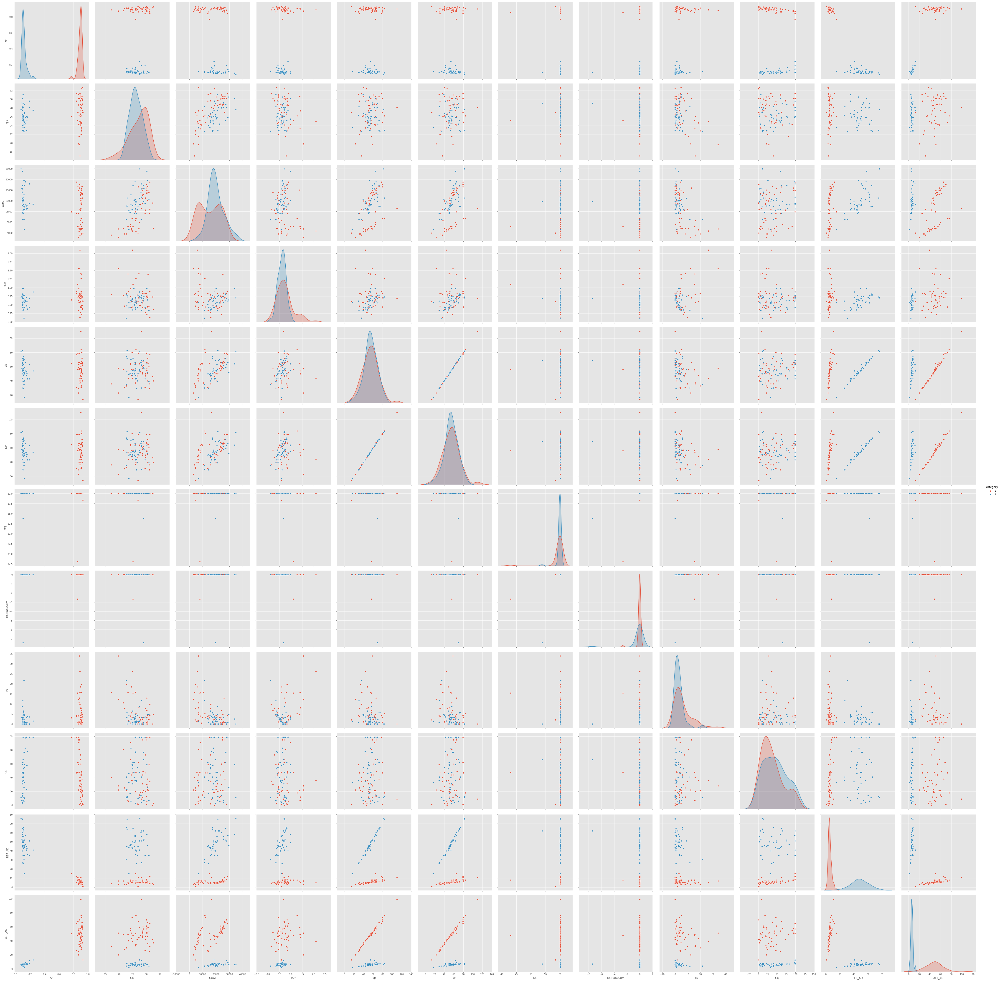

In [524]:
sns.pairplot(Ktest95, hue='category',size=5,vars=["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","REF_AD", "ALT_AD"],kind='scatter')

In [532]:
X = np.array(Ktest5[["AF","FS","QUAL"]])
y = np.array(Ktest5['category'])
X.shape

(635, 3)

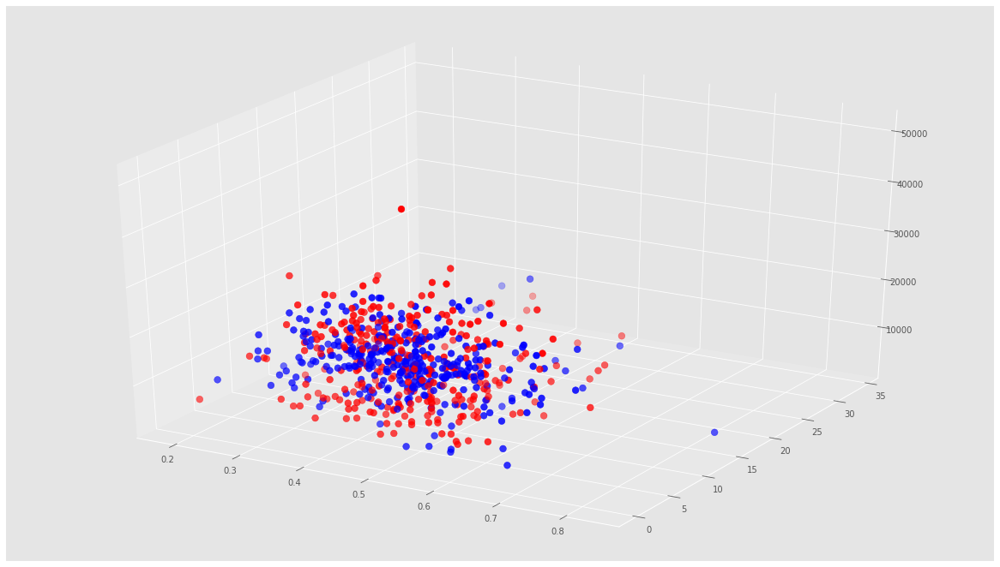

In [533]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y:
    assign.append(colors[row - 1])
ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=assign,s=60)

In [534]:
X8 = np.array(Ktest8[["AF","QUAL","FS"]])
y8 = np.array(Ktest8['category'])
X8.shape

(621, 3)

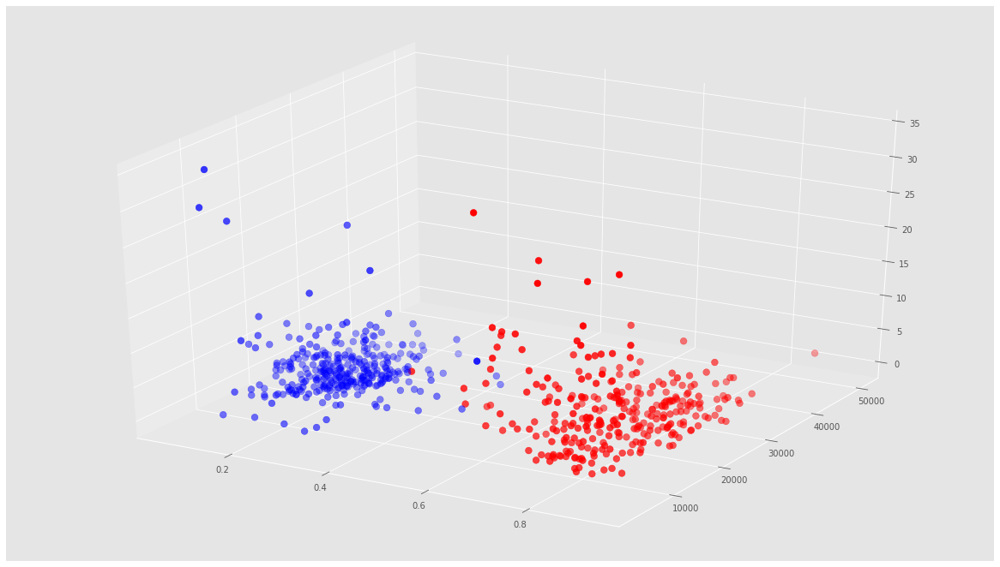

In [535]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y8:
    assign.append(colors[row - 1])
ax.scatter(X8[:, 0], X8[:, 1], X8[:, 2], c=assign,s=60)

In [536]:
X9 = np.array(Ktest9[["AF","QUAL","FS"]])
y9 = np.array(Ktest9['category'])
X9.shape

(376, 3)

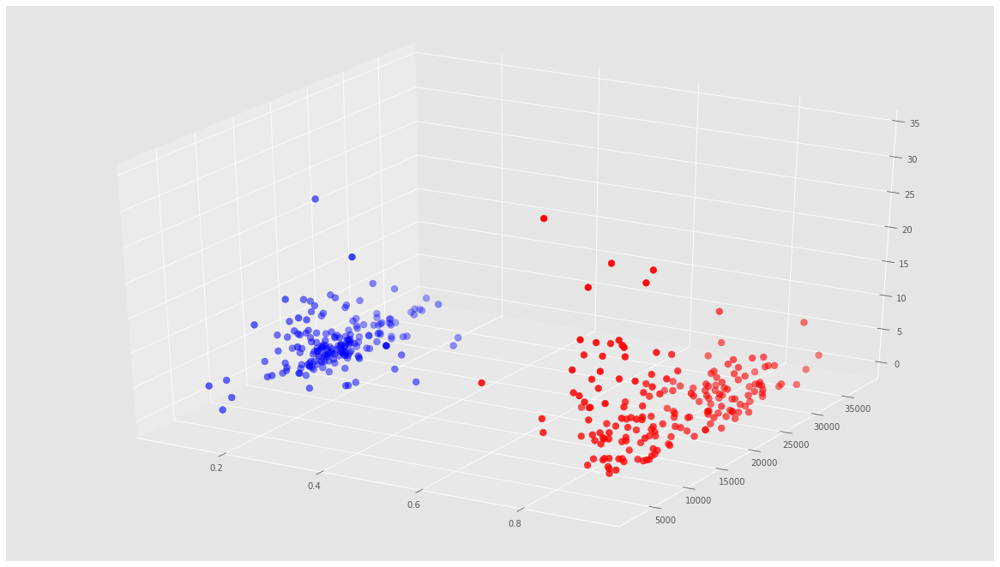

In [538]:
fig = plt.figure()
ax = Axes3D(fig)
colors=['red','blue','black','purple']
assign=[]
for row in y9:
    assign.append(colors[row - 1])
ax.scatter(X9[:, 0], X9[:, 1], X9[:, 2], c=assign,s=60)

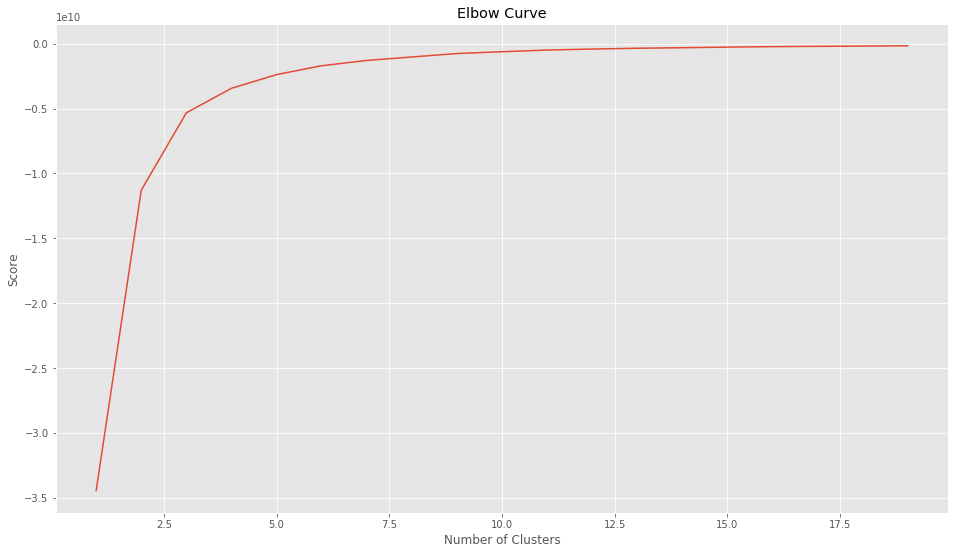

In [539]:
Nc = range(1, 20)
kmeans = [KMeans(n_clusters=i) for i in Nc]
kmeans
score = [kmeans[i].fit(X).score(X) for i in range(len(kmeans))]
score
plt.plot(Nc,score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

In [540]:
X = np.array(Ktest5[["AF","QD","FS", "MQ", "SOR", "QUAL"]])
y = np.array(Ktest5['category'])
X

array([[3.70370370e-01, 3.05700000e+01, 1.00300000e+00, 6.00000000e+01,
        4.34000000e-01, 1.99635100e+04],
       [6.21621622e-01, 2.96700000e+01, 9.19000000e-01, 6.00000000e+01,
        8.27000000e-01, 2.24031100e+04],
       [4.05063291e-01, 3.23300000e+01, 9.94000000e-01, 6.00000000e+01,
        5.73000000e-01, 3.19380400e+04],
       ...,
       [5.11111111e-01, 2.81000000e+01, 5.12000000e+00, 6.00000000e+01,
        3.34000000e-01, 1.28708900e+04],
       [5.73170732e-01, 2.58900000e+01, 0.00000000e+00, 6.00000000e+01,
        6.86000000e-01, 2.80376000e+04],
       [6.08695652e-01, 3.05200000e+01, 4.82600000e+00, 6.00000000e+01,
        6.43000000e-01, 2.95475000e+04]])

In [541]:
X = StandardScaler().fit_transform(X)
X

array([[-1.3734906 ,  0.75359416, -0.52735295,  0.13930658, -0.89822511,
         0.18988476],
       [ 1.26066543,  0.45364078, -0.54447379,  0.13930658,  0.54588727,
         0.52108334],
       [-1.00976478,  1.34016966, -0.52918732,  0.13930658, -0.38745763,
         1.81553947],
       ...,
       [ 0.10205656, -0.06961123,  0.31177194,  0.13930658, -1.26568373,
        -0.77300489],
       [ 0.75269899, -0.80616342, -0.73178391,  0.13930658,  0.02777061,
         1.28601818],
       [ 1.12514762,  0.73693009,  0.251849  ,  0.13930658, -0.13023659,
         1.49100126]])

In [542]:
kmeans = KMeans(n_clusters=2, max_iter=1000, init='k-means++').fit(X)
centroids = kmeans.cluster_centers_
print(centroids)

[[ 0.17099313  0.38035871 -0.34496034  0.09150624 -0.09945974  0.54175363]
 [-0.32937848 -0.73267254  0.66448581 -0.17626547  0.19158604 -1.04356229]]


In [543]:
kmeans

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=1000,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)

In [544]:
X8 = np.array(Ktest8[["AF","QD","FS", "MQ", "SOR", "QUAL"]])
y8 = np.array(Ktest8['category'])
X8 = StandardScaler().fit_transform(X8)

X8.shape

(621, 6)

In [545]:
kmeans8 = KMeans(n_clusters=2, max_iter=1000, init='k-means++').fit(X8)
centroids8 = kmeans8.cluster_centers_
print(centroids8)

[[-0.20945898  0.27837537 -0.31621061  0.07915618 -0.11311704  0.45607952]
 [ 0.56479117 -0.75061931  0.85263934 -0.213439    0.30501202 -1.22978586]]


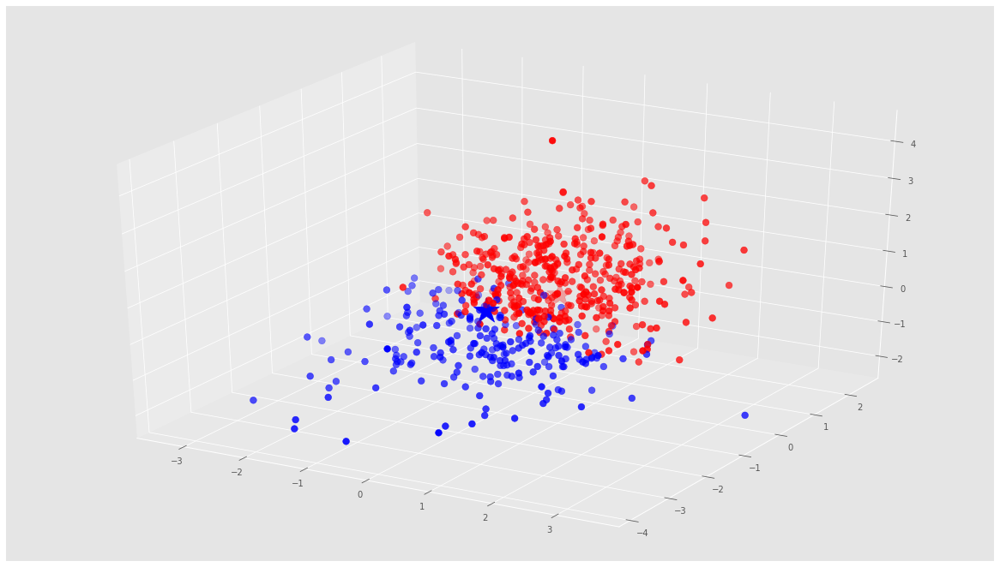

In [548]:
# Predicting the clusters
labels = kmeans.predict(X)
# Getting the cluster centers
C = kmeans.cluster_centers_
colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X[:, 0], X[:, 1], X[:, 5], c=assign,s=60)
ax.scatter(C[:, 0], C[:, 1], marker='*', c=colors, s=1000)

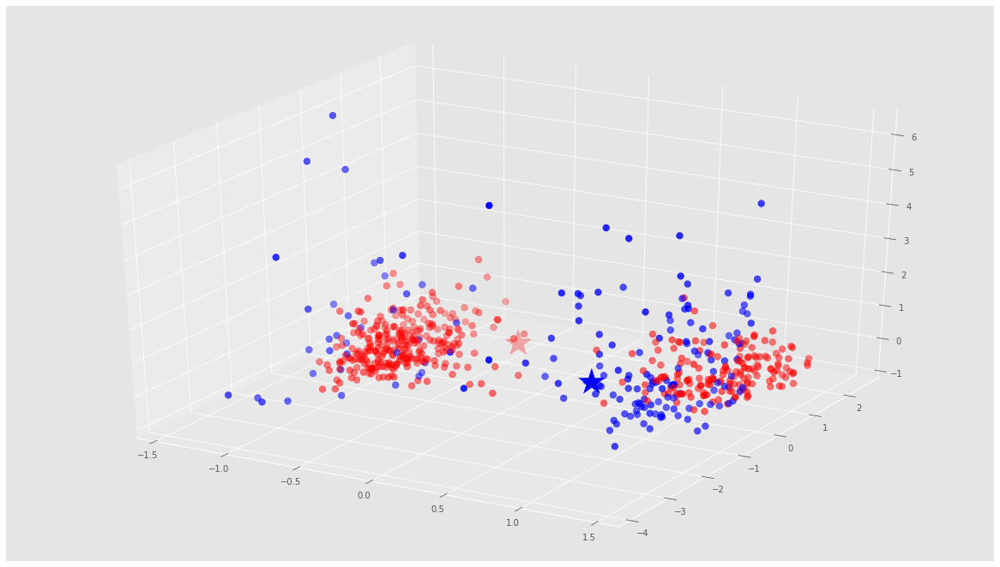

In [549]:
# Predicting the clusters
labels8 = kmeans8.predict(X8)
# Getting the cluster centers
C8 = kmeans8.cluster_centers_
colors=['red','blue']
assign=[]
for row in labels8:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X8[:, 0], X8[:, 1], X8[:, 2], c=assign,s=60)
ax.scatter(C8[:, 0], C8[:, 1], marker='*', c=colors, s=1000)

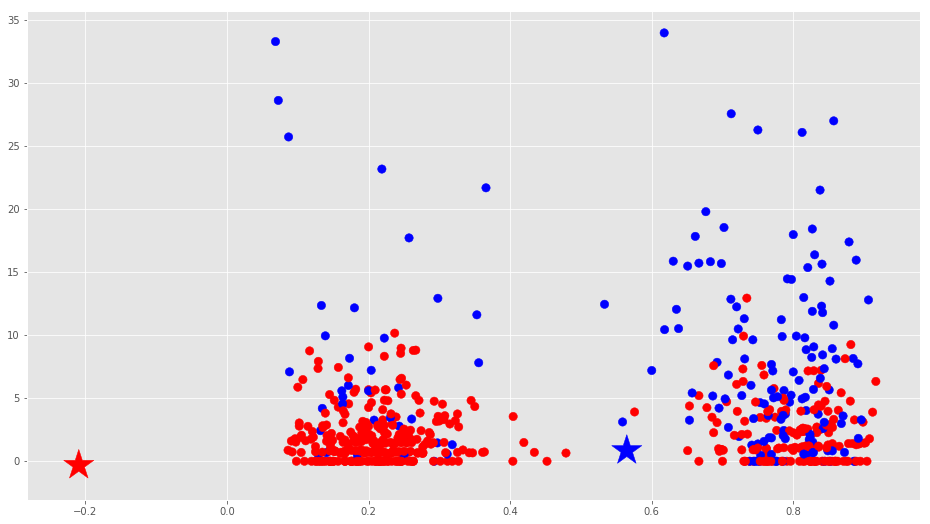

In [551]:
# Getting the values and plotting it
f1 = Ktest8['AF'].values
f2 = Ktest8['FS'].values

plt.scatter(f1, f2, c=assign, s=70)
plt.scatter(C8[:, 0], C8[:, 2], marker='*', c=colors, s=1000)
plt.show()

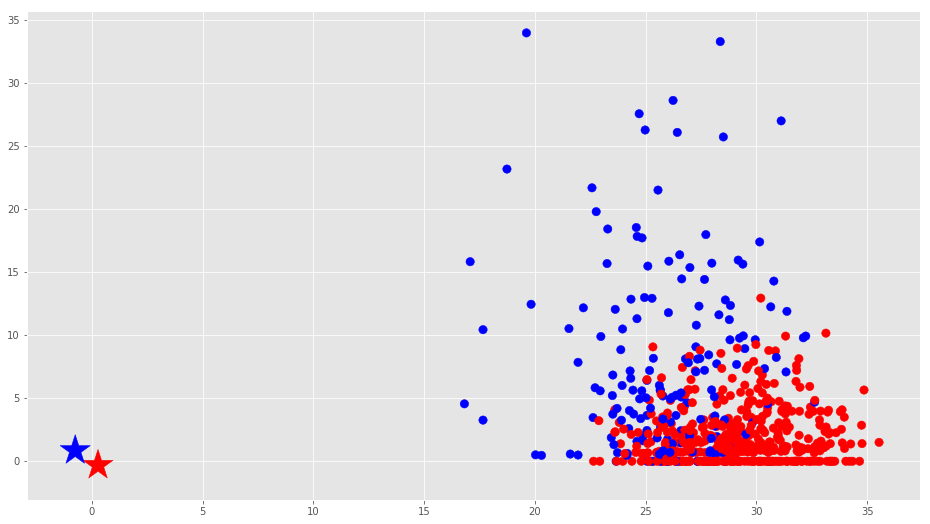

In [552]:
# Getting the values and plotting it
f1 = Ktest8['QD'].values
f2 = Ktest8['FS'].values

plt.scatter(f1, f2, c=assign, s=70)
plt.scatter(C8[:, 1], C8[:, 2], marker='*', c=colors, s=1000)
plt.show()

In [553]:
copy =  pd.DataFrame()
copy['POS']=Ktest8['POS'].values
copy['AF']=Ktest8['AF'].values
copy['category']=Ktest8['category'].values
copy['label'] = labels8;
Ngrouped =  pd.DataFrame()
Ngrouped['colors']=colors
Ngrouped['N']=copy.groupby('label').size()
Ngrouped

,colors,N
0,red,453
1,blue,168


In [554]:
copy.head()

,POS,AF,category,label
0,1977,0.761905,1,0
1,6140,0.173077,2,0
2,7585,0.694444,1,0
3,9304,0.833333,1,0
4,10741,0.705882,1,0


# Use more labels

In [555]:
W = np.array(Ktest8[["AF","QD","FS","MQ","SOR", "DP", "dp", "QUAL"]])
W

array([[7.61904762e-01, 3.05700000e+01, 1.00300000e+00, ...,
        4.20000000e+01, 4.20000000e+01, 1.99635100e+04],
       [1.73076923e-01, 2.96700000e+01, 9.19000000e-01, ...,
        5.20000000e+01, 5.20000000e+01, 2.24031100e+04],
       [6.94444444e-01, 3.23300000e+01, 9.94000000e-01, ...,
        7.20000000e+01, 7.20000000e+01, 3.19380400e+04],
       ...,
       [7.77777778e-01, 2.81000000e+01, 5.12000000e+00, ...,
        9.00000000e+01, 9.00000000e+01, 1.28708900e+04],
       [2.04819277e-01, 2.58900000e+01, 0.00000000e+00, ...,
        8.30000000e+01, 8.30000000e+01, 2.80376000e+04],
       [3.44827586e-01, 3.05200000e+01, 4.82600000e+00, ...,
        5.80000000e+01, 5.80000000e+01, 2.95475000e+04]])

In [563]:
kmeansw = KMeans(n_clusters=2, max_iter=1000, verbose=0, init='k-means++').fit(W)
centroidsw = kmeansw.cluster_centers_
print(kmeansw)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=1000,
    n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=None, tol=0.0001, verbose=0)


In [564]:
print(centroidsw)

[[4.57181705e-01 2.93440947e+01 2.04323677e+00 5.98955153e+01
  6.54662953e-01 6.86963788e+01 6.86796657e+01 2.38143167e+04]
 [5.32126011e-01 2.67321374e+01 5.69376718e+00 5.97577481e+01
  7.11175573e-01 5.57519084e+01 5.57480916e+01 1.15818698e+04]]


In [565]:
labelsw = kmeansw.predict(W)


In [566]:
w =  pd.DataFrame()
w['POS']=Ktest8['POS'].values
w['AF']=Ktest8['AF'].values
w['category']=Ktest8['category'].values
w['label'] = labelsw;

In [567]:
labelsw

array([0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0,
       1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1,
       0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0,
       0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0,

In [568]:
w.describe()

,POS,AF,category,label
count,6.210000e+02,621.000000,621.000000,621.000000
mean,2.124202e+06,0.488801,1.523349,0.421900
std,1.318997e+06,0.296933,0.499857,0.494261
min,1.977000e+03,0.068493,1.000000,0.000000
25%,1.002969e+06,0.206349,1.000000,0.000000
50%,2.058302e+06,0.344828,2.000000,0.000000
75%,3.226930e+06,0.796296,2.000000,1.000000
max,4.408156e+06,0.916667,2.000000,1.000000


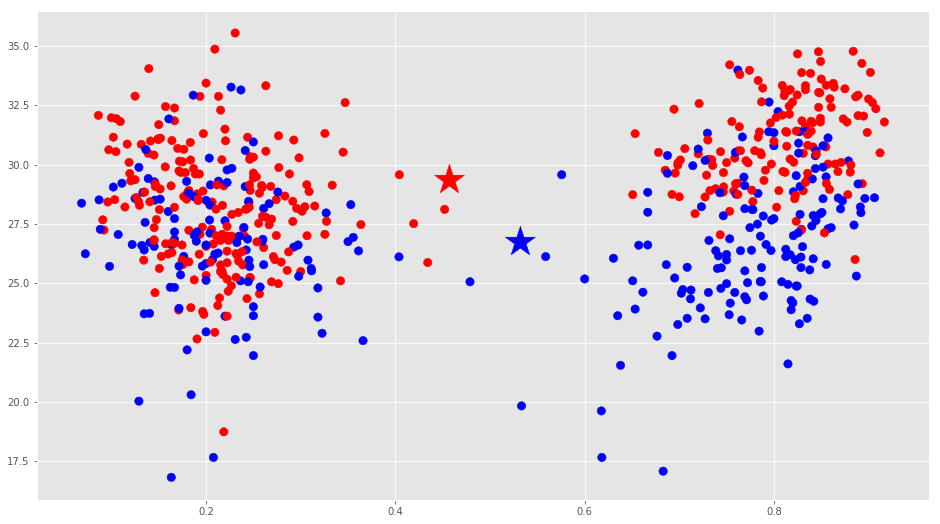

In [570]:
# Getting the values and plotting it
f1 = Ktest8['AF'].values
f2 = Ktest8['QD'].values


colors=['red','blue']
assign=[]
for row in labelsw:
    assign.append(colors[row])


plt.scatter(f1, f2, c=assign, s=70)
plt.scatter(centroidsw[:, 0], centroidsw[:, 1], marker='*', c=colors, s=1000)
plt.show()

In [344]:
 #metrics.adjusted_rand_score(labels_true, labels_pred)

# Compute Affinity Propagation

In [571]:
# #############################################################################
# Compute Affinity Propagation
af = AffinityPropagation(preference=-50).fit(X)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_

n_clusters_ = len(cluster_centers_indices)

print('Estimated number of clusters: %d' % n_clusters_)
print("Silhouette Coefficient: %0.3f"
      % metrics.silhouette_score(X, labels, metric='sqeuclidean'))


Estimated number of clusters: 15
Silhouette Coefficient: 0.245


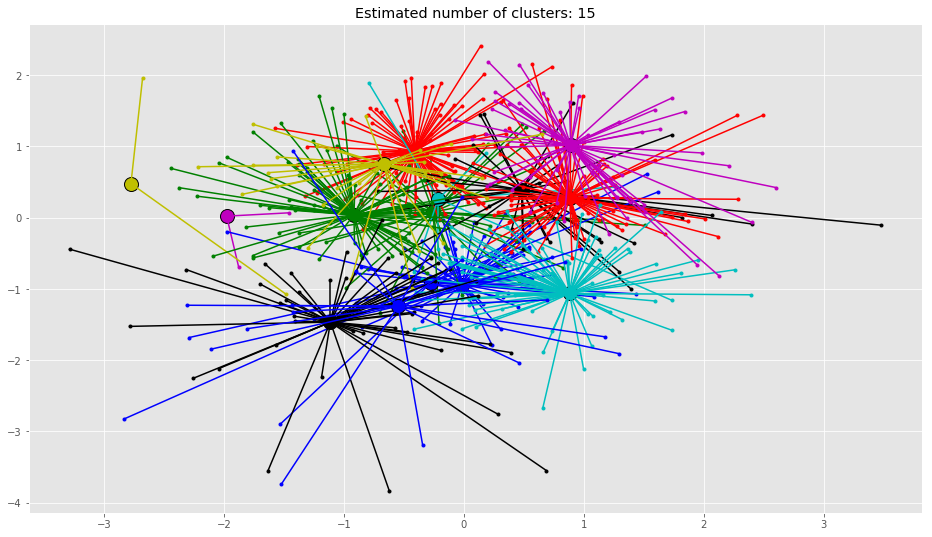

In [572]:

plt.close('all')
plt.figure(1)
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    class_members = labels == k
    cluster_center = X[cluster_centers_indices[k]]
    plt.plot(X[class_members, 0], X[class_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
    for x in X[class_members]:
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

# Compute Agglomerative Clustering

In [620]:
X8 = np.array(Ktest8[["AF", "ALT_AD","DP", "FS"]])

ward = AgglomerativeClustering(n_clusters=2,linkage='ward') #connectivity=connectivity
ward.fit(X8)
#label = np.reshape(ward.labels_, rescaled_coins.shape)
labels = ward.labels_


In [621]:
Ktest8['Label'] = labels

In [622]:
#Ktest8[Ktest8.Label == 2]

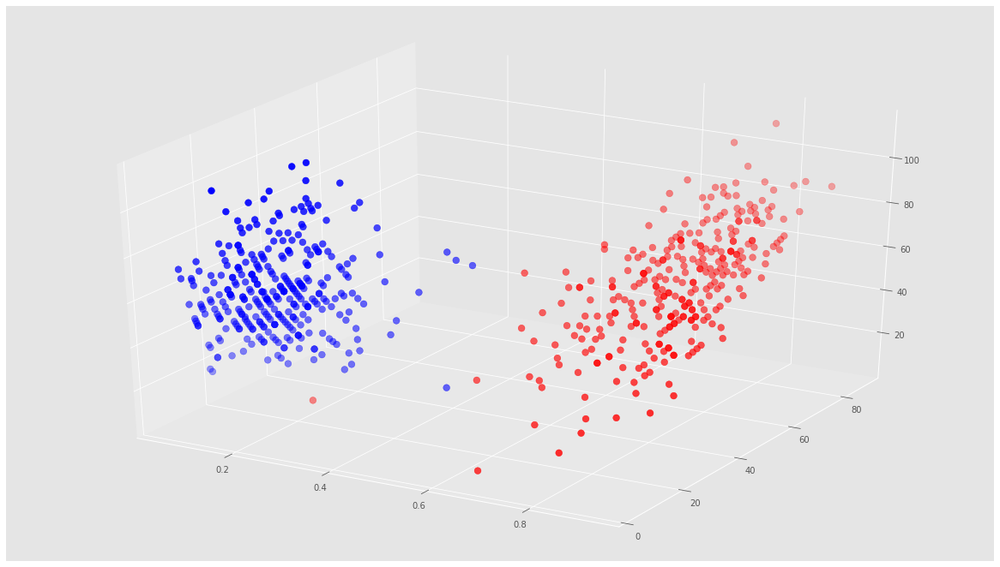

In [623]:
# Predicting the clusters

# Getting the cluster centers
colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

fig = plt.figure()
ax = Axes3D(fig)
ax.scatter(X8[:, 0], X8[:, 1], X8[:, 2], c=assign,s=60)


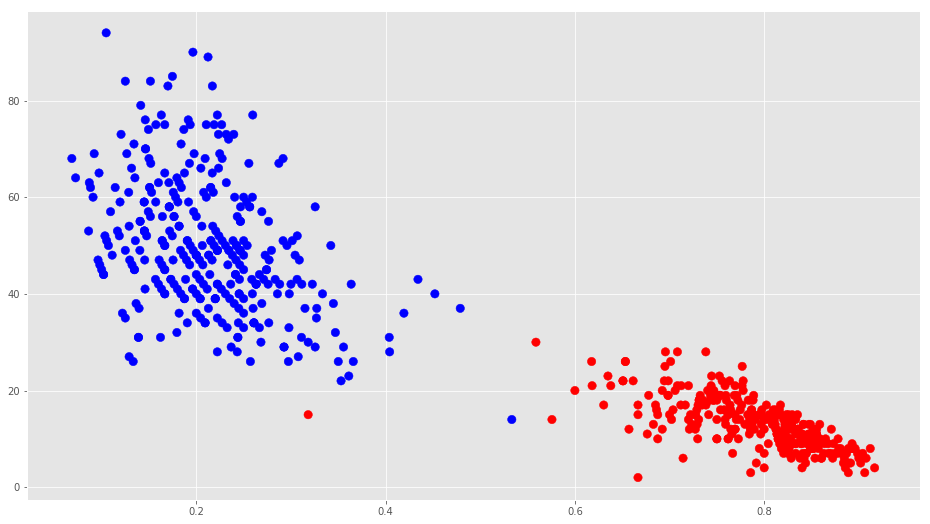

In [631]:
# Getting the values and plotting it
f1 = Ktest8['AF'].values
f2 = Ktest8['REF_AD'].values

colors=['red','blue']
assign=[]
for row in labels:
    assign.append(colors[row])

plt.scatter(f1, f2, c=assign, s=70)
plt.show()

# PCA: Principal Component Analysis
---
---

In [715]:
#cargamos los datos de entrada
dataframe = Ktest8
dataframe.tail(10)


,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category,Label
1489,MTB_anc,4391553,.,C,T,20902.35,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-7.070e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:61,9:70:99:128,0,2057",1.0,0.5,2.0,-0.707,70.0,0.0021,7.365,0.7750,60.0,0.0,28.44,1.700,1.469,0/1,"61,9",99.0,"128,0,2057",NaN,NaN,NaN,2,61.0,9.0,0,1,70.0,0.871429,0.128571,False,5325.0,26.0,1,2,1
1490,MTB_anc,4391579,.,C,G,28977.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.450e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:9,62:71:99:2205,0,143",1.0,0.5,2.0,-0.245,71.0,0.0021,8.138,0.7750,60.0,0.0,31.92,0.085,0.114,0/1,"9,62",99.0,"2205,0,143",NaN,NaN,NaN,2,9.0,62.0,0,1,71.0,0.126761,0.873239,False,26.0,229.0,1,1,0
1491,MTB_anc,4391808,.,C,T,9786.81,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.340e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:21,52:73:99:1560,0,533",1.0,0.5,2.0,-1.340,73.0,0.1954,27.577,0.4677,60.0,0.0,24.71,0.530,1.052,0/1,"21,52",99.0,"1560,0,533",NaN,NaN,NaN,2,21.0,52.0,0,1,73.0,0.287671,0.712329,False,229.0,1370.0,1,1,0
1495,MTB_anc,4395964,.,C,A,21891.11,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-1.942e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:55,9:64:99:138,0,1854",1.0,0.5,2.0,-1.942,64.0,0.0069,2.875,0.7203,60.0,0.0,28.43,1.640,0.428,0/1,"55,9",99.0,"138,0,1854",NaN,NaN,NaN,2,55.0,9.0,0,1,64.0,0.859375,0.140625,False,577.0,3972.0,1,2,1
1496,MTB_anc,4399936,.,G,T,9462.82,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-2.431e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:11,57:68:99:1596,0,240",1.0,0.5,2.0,-2.431,68.0,0.1954,6.584,0.4679,60.0,0.0,24.33,-0.104,0.922,0/1,"11,57",99.0,"1596,0,240",NaN,NaN,NaN,2,11.0,57.0,0,1,68.0,0.161765,0.838235,False,3972.0,1817.0,1,1,0
1497,MTB_anc,4401753,.,G,T,29732.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.022e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:12,81:93:99:2411,0,240",1.0,0.5,2.0,-3.022,93.0,0.0021,0.000,0.7750,60.0,0.0,30.09,0.654,0.959,0/1,"12,81",99.0,"2411,0,240",NaN,NaN,NaN,2,12.0,81.0,0,1,93.0,0.129032,0.870968,False,1817.0,2147.0,1,1,0
1498,MTB_anc,4403900,.,A,G,33910.51,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=3.52;DP=60;Exc...,GT:AD:DP:GQ:PL,"0/1:47,13:60:99:387,0,1457",1.0,0.5,2.0,3.520,60.0,0.0442,2.570,0.5556,60.0,0.0,30.20,1.700,0.974,0/1,"47,13",99.0,"387,0,1457",NaN,NaN,NaN,2,47.0,13.0,0,1,60.0,0.783333,0.216667,False,2147.0,3210.0,1,2,1
1499,MTB_anc,4407110,.,G,C,12870.89,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.118;DP=90;Ex...,GT:AD:DP:GQ:PL,"0/1:20,70:90:99:2170,0,439",1.0,0.5,2.0,0.118,90.0,0.0251,5.120,0.6786,60.0,0.0,28.10,-0.384,0.334,0/1,"20,70",99.0,"2170,0,439",NaN,NaN,NaN,2,20.0,70.0,0,1,90.0,0.222222,0.777778,False,3210.0,478.0,1,1,0
1501,MTB_anc,4407970,.,G,A,28037.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-6.550e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:66,17:83:99:296,0,1912",1.0,0.5,2.0,-0.655,83.0,0.0111,0.000,0.6656,60.0,0.0,25.89,-0.751,0.686,0/1,"66,17",99.0,"296,0,1912",NaN,NaN,NaN,2,66.0,17.0,0,1,83.0,0.795181,0.204819,False,382.0,186.0,1,2,1
1502,MTB_anc,4408156,.,A,C,29547.50,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.456;DP=58;Ex...,GT:AD:DP:GQ:PL,"0/1:38,20:58:99:506,0,1112",1.0,0.5,2.0,0.456,58.0,0.0442,4.826,0.5558,60.0,0.0,30.52,1.140,0.643,0/1,"38,20",99.0,"506,0,1112",NaN,NaN,NaN,2,38.0,20.0,0,1,58.0,0.655172,0.344828,False,186.0,764.0,1,2,1


In [716]:
#normalizamos los datos
scaler=StandardScaler()
df = dataframe[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"]] # quito la variable dependiente "Y"
scaler.fit(df) # calculo la media para poder hacer la transformacion
X_scaled=scaler.transform(df)# Ahora si, escalo los datos y los normalizo

In [717]:
df.head()

,AF,QD,QUAL,SOR,dp,DP,MQ,MQRankSum,FS,GQ,BaseQRankSum,ExcessHet,REF_AD,ALT_AD,ReadPosRankSum
0,0.761905,30.57,19963.51,0.434,42.0,42.0,60.0,0.0,1.003,99.0,0.72,0.0442,10.0,32.0,0.655
2,0.173077,29.67,22403.11,0.827,52.0,52.0,60.0,0.0,0.919,99.0,1.43,0.0069,43.0,9.0,-0.273
3,0.694444,32.33,31938.04,0.573,72.0,72.0,60.0,0.0,0.994,99.0,1.27,0.0111,22.0,50.0,-0.405
5,0.833333,33.15,33683.24,0.412,84.0,84.0,60.0,0.0,2.716,99.0,1.59,0.0021,14.0,70.0,-0.480
6,0.705882,30.67,25056.54,1.392,68.0,68.0,60.0,0.0,4.721,99.0,1.52,0.0442,20.0,48.0,-0.615


In [718]:
X_scaled.shape

(621, 15)

In [719]:
#Instanciamos objeto PCA y aplicamos
#pca=PCA(n_components=9) # Otra opción es instanciar pca sólo con dimensiones nuevas hasta obtener un mínimo "explicado" ej.: pca=PCA(.85)
pca=PCA(.85)
pca.fit(X_scaled) # obtener los componentes principales
X_pca=pca.transform(X_scaled) # convertimos nuestros datos con las nuevas dimensiones de PCA

In [720]:
pca

PCA(copy=True, iterated_power='auto', n_components=0.85, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [721]:
print("shape of X_pca", X_pca.shape)
expl = pca.explained_variance_ratio_
print(expl)
print('suma:',sum(expl[0:len(expl)]))
#Vemos que con 8 componentes tenemos algo mas del 85% de varianza explicada

shape of X_pca (621, 8)
[0.1975217  0.18839519 0.12436442 0.10968146 0.08140738 0.06342859
 0.06146967 0.05414755]
suma: 0.8804159524723986


In [722]:
np.cumsum(pca.explained_variance_ratio_)

array([0.1975217 , 0.38591689, 0.51028131, 0.61996277, 0.70137015,
       0.76479873, 0.82626841, 0.88041595])

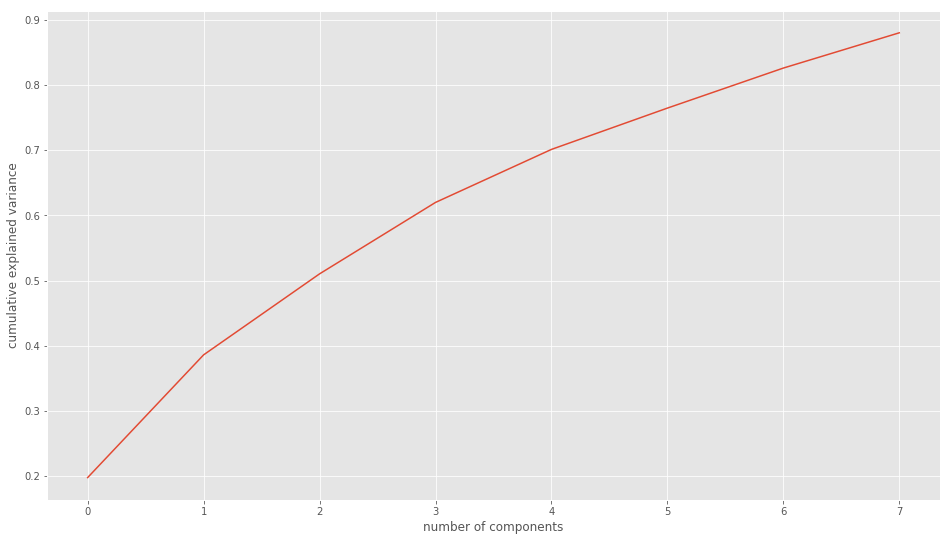

In [723]:
#graficamos el acumulado de varianza explicada en las nuevas dimensiones
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

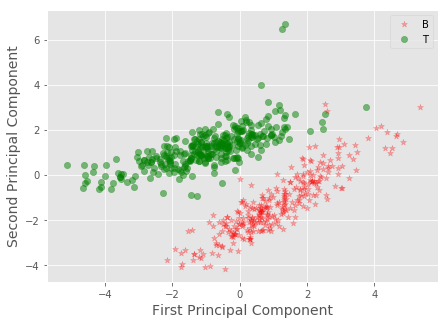

In [724]:
#graficamos en 2 Dimensiones, tomando los 2 primeros componentes principales
Xax=X_pca[:,0]
Yax=X_pca[:,1]
labels=dataframe['Label'].values
cdict={0:'red',1:'green'}
labl={0:'B',1:'T'}
marker={0:'*',1:'o'}
alpha={0:.3, 1:.5}
fig,ax=plt.subplots(figsize=(7,5))
fig.patch.set_facecolor('white')
for l in np.unique(labels):
    ix=np.where(labels==l)
    ax.scatter(Xax[ix],Yax[ix],c=cdict[l],label=labl[l],s=40,marker=marker[l],alpha=alpha[l])

plt.xlabel("First Principal Component",fontsize=14)
plt.ylabel("Second Principal Component",fontsize=14)
plt.legend()
plt.show()

In [725]:
pd.DataFrame(pca.components_,columns=df.columns,index = ['1','2', '3','4','5','6','7','8'])

,AF,QD,QUAL,SOR,dp,DP,MQ,MQRankSum,FS,GQ,BaseQRankSum,ExcessHet,REF_AD,ALT_AD,ReadPosRankSum
1,0.344782,-0.051233,-0.393589,0.046382,-0.419408,-0.419405,-0.041494,-0.023573,0.284788,-0.109235,-0.129949,0.078110,-0.476931,0.153398,-0.018348
2,-0.459459,-0.216413,-0.239633,0.103192,-0.299582,-0.299734,-0.152871,-0.105188,0.109227,-0.104833,0.175789,0.041711,0.313332,-0.549420,0.066065
3,0.033483,-0.482897,-0.215588,0.227778,0.311079,0.310949,-0.291675,-0.040425,0.346883,0.090629,-0.168400,0.444713,0.107031,0.134819,-0.053471
4,0.086483,0.329522,0.145820,0.222587,0.084385,0.084542,-0.490318,-0.484663,0.179750,-0.389957,0.330707,-0.129500,-0.036496,0.102601,0.034299
5,0.040646,0.248136,0.135604,0.060888,-0.044508,-0.044441,-0.087793,0.512430,0.087505,0.027739,0.409298,0.496855,-0.042303,0.007906,0.464504
6,-0.060714,0.120037,0.168680,-0.453811,-0.044987,-0.045079,-0.244736,0.236104,0.026797,-0.372458,-0.103899,0.329023,0.033316,-0.068664,-0.602903
7,0.022604,0.138653,0.022240,0.637881,-0.069181,-0.068631,0.072554,0.128584,-0.134757,0.289274,0.256186,0.073043,-0.033952,-0.019756,-0.605999
8,-0.000895,-0.064271,0.047912,0.481274,0.026587,0.026591,0.187583,0.225378,-0.241730,-0.684092,-0.357259,0.018531,0.040409,-0.019978,0.134640


In [699]:
#cargamos los datos de entrada
dataframe = Ktest5
dataframe.tail()


,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
1530,MTB_anc,4401753,.,G,T,29732.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-3.022e+00;DP=...,GT:AD:DP:GQ:PL,"0/1:31,48:79:99:1342,0,986",1.0,0.5,2.0,-3.022,79.0,0.0021,0.000,0.7750,60.0,0.0,30.09,0.654,0.959,0/1,"31,48",99.0,"1342,0,986",NaN,NaN,NaN,2,31.0,48.0,0,1,79.0,0.392405,0.607595,False,1817.0,2147.0,1,1
1531,MTB_anc,4403900,.,A,G,33910.51,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=3.52;DP=63;Exc...,GT:AD:DP:GQ:PL,"0/1:25,38:63:99:1311,0,671",1.0,0.5,2.0,3.520,63.0,0.0442,2.570,0.5556,60.0,0.0,30.20,1.700,0.974,0/1,"25,38",99.0,"1311,0,671",NaN,NaN,NaN,2,25.0,38.0,0,1,63.0,0.396825,0.603175,False,2147.0,3210.0,1,2
1532,MTB_anc,4407110,.,G,C,12870.89,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.118;DP=90;Ex...,GT:AD:DP:GQ:PL,"0/1:44,46:90:99:1316,0,1210",1.0,0.5,2.0,0.118,90.0,0.0251,5.120,0.6786,60.0,0.0,28.10,-0.384,0.334,0/1,"44,46",99.0,"1316,0,1210",NaN,NaN,NaN,2,44.0,46.0,0,1,90.0,0.488889,0.511111,False,3210.0,478.0,1,1
1534,MTB_anc,4407970,.,G,A,28037.60,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=-6.550e-01;DP=...,GT:AD:DP:GQ:PL,"0/1:35,47:82:99:1260,0,943",1.0,0.5,2.0,-0.655,82.0,0.0111,0.000,0.6656,60.0,0.0,25.89,-0.751,0.686,0/1,"35,47",99.0,"1260,0,943",NaN,NaN,NaN,2,35.0,47.0,0,1,82.0,0.426829,0.573171,False,382.0,186.0,1,2
1535,MTB_anc,4408156,.,A,C,29547.50,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.456;DP=69;Ex...,GT:AD:DP:GQ:PL,"0/1:27,42:69:99:1326,0,631",1.0,0.5,2.0,0.456,69.0,0.0442,4.826,0.5558,60.0,0.0,30.52,1.140,0.643,0/1,"27,42",99.0,"1326,0,631",NaN,NaN,NaN,2,27.0,42.0,0,1,69.0,0.391304,0.608696,False,186.0,764.0,1,2


In [700]:
#normalizamos los datos
scaler=StandardScaler()
df = dataframe[["AF","QD", "QUAL", "SOR","dp", "DP", "MQ","MQRankSum", "FS","GQ","BaseQRankSum", "ExcessHet","REF_AD", "ALT_AD", "ReadPosRankSum"]] # quito la variable dependiente "Y"
scaler.fit(df) # calculo la media para poder hacer la transformacion
X_scaled=scaler.transform(df)# Ahora si, escalo los datos y los normalizo


#Instanciamos objeto PCA y aplicamos
#pca=PCA(n_components=9) # Otra opción es instanciar pca sólo con dimensiones nuevas hasta obtener un mínimo "explicado" ej.: pca=PCA(.85)
pca=PCA(.85)
pca.fit(X_scaled) # obtener los componentes principales
X_pca=pca.transform(X_scaled) # convertimos nuestros datos con las nuevas dimensiones de PCA


print("shape of X_pca", X_pca.shape)
expl = pca.explained_variance_ratio_
print(expl)
print('suma:',sum(expl[0:len(expl)]))
#Vemos que con 5 componentes tenemos algo mas del 85% de varianza explicada

shape of X_pca (635, 8)
[0.25215994 0.15207652 0.11826714 0.08970832 0.07733107 0.06782797
 0.06094475 0.05533274]
suma: 0.8736484474003695


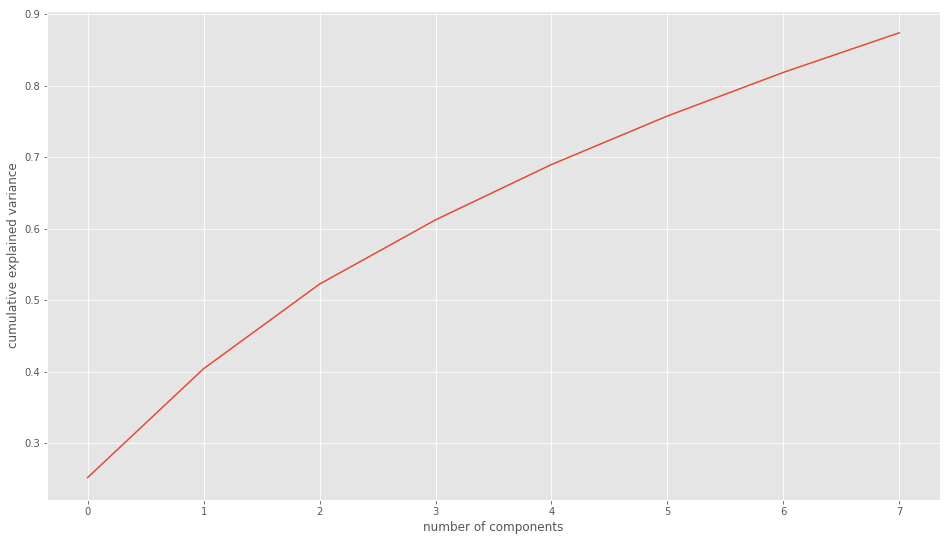

In [701]:
#graficamos el acumulado de varianza explicada en las nuevas dimensiones
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

In [702]:
dataframe.head()

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,sample,AC,af,AN,BaseQRankSum,DP,ExcessHet,FS,InbreedingCoeff,MQ,MQRankSum,QD,ReadPosRankSum,SOR,GT,AD,GQ,PL,PGT,PID,PS,len_AD,REF_AD,ALT_AD,gt0,gt1,dp,aF,AF,Is_repeat,snp_left_distance,snp_right_distance,Window_10,category
0,MTB_anc,1977,.,G,A,19963.51,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=0.720;DP=54;Ex...,GT:AD:DP:GQ:PL,"0/1:34,20:54:99:571,0,1117",1.0,0.5,2.0,0.72,54.0,0.0442,1.003,0.5558,60.0,0.0,30.57,0.655,0.434,0/1,"34,20",99.0,"571,0,1117",NaN,NaN,NaN,2,34.0,20.0,0,1,54.0,0.629630,0.370370,False,1977.0,555.0,1,1
2,MTB_anc,6140,.,G,T,22403.11,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.43;DP=74;Exc...,GT:AD:DP:GQ:PL,"0/1:28,46:74:99:1388,0,597",1.0,0.5,2.0,1.43,74.0,0.0069,0.919,0.7203,60.0,0.0,29.67,-0.273,0.827,0/1,"28,46",99.0,"1388,0,597",NaN,NaN,NaN,2,28.0,46.0,0,1,74.0,0.378378,0.621622,False,3608.0,1445.0,1,2
3,MTB_anc,7585,.,C,G,31938.04,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.27;DP=79;Exc...,GT:AD:DP:GQ:PL,"0/1:47,32:79:99:920,0,1429",1.0,0.5,2.0,1.27,79.0,0.0111,0.994,0.6656,60.0,0.0,32.33,-0.405,0.573,0/1,"47,32",99.0,"920,0,1429",NaN,NaN,NaN,2,47.0,32.0,0,1,79.0,0.594937,0.405063,False,1445.0,1558.0,1,1
5,MTB_anc,9304,.,A,G,33683.24,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.59;DP=77;Exc...,GT:AD:DP:GQ:PL,"0/1:35,42:77:99:1307,0,908",1.0,0.5,2.0,1.59,77.0,0.0021,2.716,0.7750,60.0,0.0,33.15,-0.480,0.412,0/1,"35,42",99.0,"1307,0,908",NaN,NaN,NaN,2,35.0,42.0,0,1,77.0,0.454545,0.545455,False,161.0,1437.0,1,1
6,MTB_anc,10741,.,C,G,25056.54,PASS,AC=1;AF=0.500;AN=2;BaseQRankSum=1.52;DP=74;Exc...,GT:AD:DP:GQ:PL,"0/1:42,32:74:99:853,0,1395",1.0,0.5,2.0,1.52,74.0,0.0442,4.721,0.5564,60.0,0.0,30.67,-0.615,1.392,0/1,"42,32",99.0,"853,0,1395",NaN,NaN,NaN,2,42.0,32.0,0,1,74.0,0.567568,0.432432,False,1437.0,2719.0,1,1


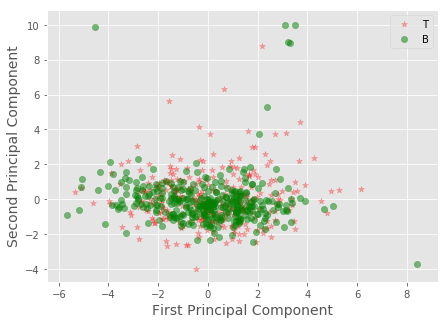

In [703]:
#graficamos en 2 Dimensiones, tomando los 2 primeros componentes principales
Xax=X_pca[:,0]
Yax=X_pca[:,1]
labels=(dataframe['category'].values -1)
cdict={0:'red',1:'green'}
labl={0:'T',1:'B'}
marker={0:'*',1:'o'}
alpha={0:.3, 1:.5}
fig,ax=plt.subplots(figsize=(7,5))
fig.patch.set_facecolor('white')
for l in np.unique(labels):
    ix=np.where(labels==l)
    ax.scatter(Xax[ix],Yax[ix],c=cdict[l],label=labl[l],s=40,marker=marker[l],alpha=alpha[l])

plt.xlabel("First Principal Component",fontsize=14)
plt.ylabel("Second Principal Component",fontsize=14)
plt.legend()
plt.show()

In [710]:
pca.components_.shape

(8, 15)

In [726]:
# Dump components relations with features:
corr_PCA_col = pd.DataFrame(pca.components_,columns=df.columns,index = ['1','2', '3','4','5','6','7','8'])
corr_PCA_col

,AF,QD,QUAL,SOR,dp,DP,MQ,MQRankSum,FS,GQ,BaseQRankSum,ExcessHet,REF_AD,ALT_AD,ReadPosRankSum
1,0.344782,-0.051233,-0.393589,0.046382,-0.419408,-0.419405,-0.041494,-0.023573,0.284788,-0.109235,-0.129949,0.078110,-0.476931,0.153398,-0.018348
2,-0.459459,-0.216413,-0.239633,0.103192,-0.299582,-0.299734,-0.152871,-0.105188,0.109227,-0.104833,0.175789,0.041711,0.313332,-0.549420,0.066065
3,0.033483,-0.482897,-0.215588,0.227778,0.311079,0.310949,-0.291675,-0.040425,0.346883,0.090629,-0.168400,0.444713,0.107031,0.134819,-0.053471
4,0.086483,0.329522,0.145820,0.222587,0.084385,0.084542,-0.490318,-0.484663,0.179750,-0.389957,0.330707,-0.129500,-0.036496,0.102601,0.034299
5,0.040646,0.248136,0.135604,0.060888,-0.044508,-0.044441,-0.087793,0.512430,0.087505,0.027739,0.409298,0.496855,-0.042303,0.007906,0.464504
6,-0.060714,0.120037,0.168680,-0.453811,-0.044987,-0.045079,-0.244736,0.236104,0.026797,-0.372458,-0.103899,0.329023,0.033316,-0.068664,-0.602903
7,0.022604,0.138653,0.022240,0.637881,-0.069181,-0.068631,0.072554,0.128584,-0.134757,0.289274,0.256186,0.073043,-0.033952,-0.019756,-0.605999
8,-0.000895,-0.064271,0.047912,0.481274,0.026587,0.026591,0.187583,0.225378,-0.241730,-0.684092,-0.357259,0.018531,0.040409,-0.019978,0.134640


In [727]:
# Get a series containing maximum value of each column
maxValuesObj = corr_PCA_col.max()
print('Maximum value in each column : ')
print(maxValuesObj)

Maximum value in each column : 
AF                0.344782
QD                0.329522
QUAL              0.168680
SOR               0.637881
dp                0.311079
DP                0.310949
MQ                0.187583
MQRankSum         0.512430
FS                0.346883
GQ                0.289274
BaseQRankSum      0.409298
ExcessHet         0.496855
REF_AD            0.313332
ALT_AD            0.153398
ReadPosRankSum    0.464504
dtype: float64


In [730]:
#corr_PCA_col.append(maxValuesObj, ignore_index=True)